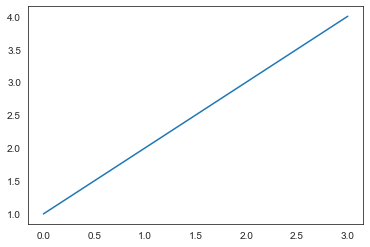

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
from pprint import pprint
%matplotlib inline
sns.set_style("white")
plt.plot(np.arange(1,5));

In [2]:
path_to_files = '../data/YAGO3-10-DR/'
project = "YAGO3-10-DR"
df_train = pd.read_csv(path_to_files+"train.txt", sep='\t', header=None, dtype='str')
df_train.columns = ['head', 'rel', 'tail']
# in case no valid.txt being there
try:
    df_eval = pd.read_csv(path_to_files+"valid.txt", sep='\t', header=None, dtype='str')
    df_eval.columns = ['head', 'rel', 'tail']
except FileNotFoundError:
    df_eval = df_train.copy()

df_test = pd.read_csv(path_to_files+"test.txt", sep='\t', header=None, dtype='str')
df_test.columns = ['head', 'rel', 'tail']
for cur_df in [df_train, df_eval, df_test]:
    #cur_df = cur_df.astype(str)
    if "YAGO" in path_to_files:
        for col in cur_df.columns:
            cur_df[col] = cur_df[col] + "_YAGO"

already_seen_triples = set(df_train.to_records(index=False).tolist() + df_eval.to_records(index=False).tolist())
print(f'Total: {len(already_seen_triples)} triples in train + eval!)')
print(f'In train: {len(df_train)}')

Total: 735915 triples in train + eval!)
In train: 732556


In [3]:
if "YAGO" in path_to_files:
    df_train.to_csv(path_to_files + "train_YAGO.txt", index=False, header=False, sep='\t')
    df_test.to_csv(path_to_files + "test_YAGO.txt", index=False, header=False, sep='\t')
    df_eval.to_csv(path_to_files + "valid_YAGO.txt", index=False, header=False, sep='\t')


In [4]:
unique_ents = sorted(set(df_train['head'].values.tolist() + df_train['tail'].values.tolist()))
unique_rels = sorted(list(df_train['rel'].unique()))
print(f'# of unique rels: {len(unique_rels)}')
df_train['head_type'] = "head__" + df_train['rel'].astype(str)
df_train['tail_type'] = "tail__" + df_train['rel'].astype(str)

# of unique rels: 36


In [5]:
from collections import defaultdict
head_dict = df_train.groupby('head')['head_type'].agg(list).to_dict()
tail_dict = df_train.groupby('tail')['tail_type'].agg(list).to_dict()
total_dict = defaultdict(set)

In [6]:
for ent, values in head_dict.items():
    total_dict[ent] = total_dict[ent].union(values)
for ent, values in tail_dict.items():
    total_dict[ent] = total_dict[ent].union(values)
print(f'# of unique ents: {len(total_dict)}')

# of unique ents: 122780


# Approach 1

- Create 2 * |R| types (head__r1, tail__r1, head__r2, tail_r2, ...)
- Retrieve boolean types of entities
- Add all edges of the form: ENT1 -- HAS_TYPE -- TYPE_R

In [7]:
try:
    del df_train['head_type']
    del df_train['tail_type']
except KeyError:
    pass

In [ ]:
to_add_triples = []
c = []
for key, values in total_dict.items():
    for value in values:
        to_add_triples.append((key, 'HAS_TYPE', value))
    c.append(len(values))
print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {np.mean(c):.2f}')

In [ ]:
updated_train = df_train.append(pd.DataFrame(to_add_triples, columns=df_test.columns))
# name to save
updated_train.to_csv(path_to_files+"train_raw_types.txt", index=False, header=False, sep='\t')

# THERE IS A NEED TO REDUCE THE NUMBER OF RULES BECAUSE OF THE GROUNDING PROCEDURE FOR TOO MANY HAS_TYPE RULES
( + too many entities exhibiting the has_type relation probably?)

In [8]:
def head_rel(rule):
    """
    Helper function to get the relation in the head of a rule.
    Input:
     - rule: str,
       rule in the form h(A,X) <= b(B,Y) ...
    """
    return rule.split('<=')[0].split('(')[0]

def keep_only_subset_of_anyburl_rules(path_to_rules, path_to_write=None, unwanted_heads=['HAS_TYPE']):
    """
    Keep only the rules without specific predicates in the head
    Input:
     - path_to_rules: str,
       path to rules as generated by AnyBURL
     - path_to_rules: str,
       path to file in which the updated rules will be saved.
     - unwanted_heads: list,
       label of the wanted relation type to keep
    Output:
        None
    """
    if not(path_to_write):
        path_to_write = path_to_rules
    df = pd.read_csv(path_to_rules, sep='\t')
    df.columns = ['Body', 'Head', 'Conf', 'Rule']
    n_initial = len(df)
    df['head_rule'] = df['Rule'].apply(head_rel)
    df_subset = df.copy()
    df_subset = df_subset[~df_subset['head_rule'].isin(unwanted_heads)]
    del df_subset['head_rule']
    print(f'Initially: {n_initial} | Currently: {len(df_subset)}  (Dropped {100*(n_initial - len(df_subset))/n_initial:.2f} %) ')
    df_subset.to_csv(path_to_write, index=False, header=False, sep='\t')
    return None

#keep_only_subset_of_anyburl_rules(f"../AnyBURL/rules/{project}_raw-100")

# Approach 2

- Create frequent itemsets of types.
- Check confidence distributions (simple and cum-sum).
- Use a threshold for confidence and keep only a subset of those.
- Add all edges of the form: ENT1 -- HAS_TYPE -- ITEMSET_2

In [7]:
from mlxtend.preprocessing import TransactionEncoder
transactions = list([list(item) for item in total_dict.values()])
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)
df.index = list(total_dict.keys())
df

,head__0_YAGO,head__10_YAGO,head__11_YAGO,head__12_YAGO,head__13_YAGO,head__14_YAGO,head__15_YAGO,head__16_YAGO,head__17_YAGO,head__18_YAGO,...,tail__33_YAGO,tail__34_YAGO,tail__35_YAGO,tail__3_YAGO,tail__4_YAGO,tail__5_YAGO,tail__6_YAGO,tail__7_YAGO,tail__8_YAGO,tail__9_YAGO
0_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
100000_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
100001_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
100002_YAGO,False,False,False,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
100003_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99890_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99891_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99892_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99896_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


0

In [18]:
transactions[0]

['tail__35_YAGO',
 'head__27_YAGO',
 'tail__4_YAGO',
 'tail__0_YAGO',
 'tail__1_YAGO']

In [13]:
raw_types = []
for key, val in (df.astype(int).sum() / len(ent2id)).items():
    raw_types.append({"support":val, 'itemsets':frozenset([key]), 'num_items':1})
raw_types_df = pd.DataFrame(raw_types)
raw_types_df


,support,itemsets,num_items
0,0.043985,(head__0_YAGO),1
1,0.017560,(head__10_YAGO),1
2,0.023063,(head__11_YAGO),1
3,0.000887,(head__12_YAGO),1
4,0.538624,(head__13_YAGO),1
...,...,...,...
67,0.022786,(tail__5_YAGO),1
68,0.000244,(tail__6_YAGO),1
69,0.008605,(tail__7_YAGO),1
70,0.011137,(tail__8_YAGO),1


In [28]:
df.columns.get_loc('head__0_YAGO')
occurrences = np.zeros((len(df.columns), len(df.columns)))
for i, row in tqdm.tqdm_notebook(df_train.iterrows(), total=len(df_train)):
    head_labels_indexes = [df.columns.get_loc(type_) for type_ in total_dict[row['head']]]
    tail_labels_indexes = [df.columns.get_loc(type_) for type_ in total_dict[row['tail']]]
    occurrences[np.ix_(head_labels_indexes, tail_labels_indexes)] += 1
occurrences


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/732556 [00:00<?, ?it/s]

array([[4.770e+02, 3.180e+02, 1.700e+01, ..., 5.560e+02, 1.316e+03,
        1.000e+00],
       [0.000e+00, 2.570e+03, 0.000e+00, ..., 0.000e+00, 3.582e+03,
        0.000e+00],
       [2.850e+02, 1.337e+03, 3.692e+03, ..., 1.210e+03, 2.558e+03,
        6.000e+00],
       ...,
       [0.000e+00, 1.333e+03, 0.000e+00, ..., 0.000e+00, 1.247e+03,
        0.000e+00],
       [0.000e+00, 2.270e+03, 0.000e+00, ..., 0.000e+00, 3.238e+03,
        0.000e+00],
       [3.000e+00, 5.760e+02, 4.000e+00, ..., 1.453e+03, 8.200e+02,
        4.240e+02]])

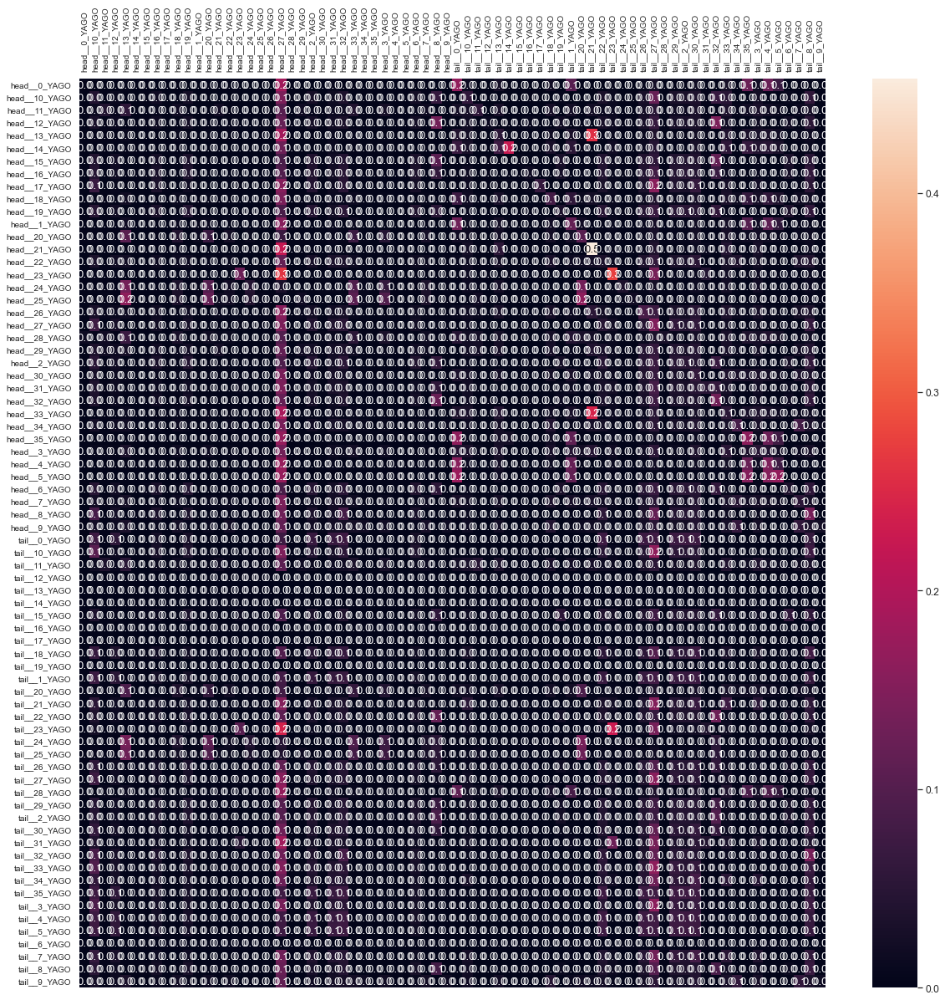

In [37]:
with sns.plotting_context(context='notebook', font_scale=1.1):
    cooccur = (occurrences / (occurrences.sum(axis=1) + 0.0000001)[:, np.newaxis])
    plt.figure(figsize=(20,20))
    val_df = pd.DataFrame(cooccur, index=df.columns, columns=df.columns)
    ax = sns.heatmap(val_df,annot=True, fmt='.1f')
    plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
    plt.xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=90)

In [29]:
import tqdm
from collections import defaultdict
def get_filtering_cache(df_train, df_eval, df_test):
    cache_triples = defaultdict(list)
    all_triples = pd.concat((df_train, df_eval, df_test))
    for triple in tqdm.tqdm_notebook(all_triples.to_records()):
        # Adding h,r ->t
        cache_triples[(triple[1], triple[2])].append(triple[3])
        # Addubg r, t -> h
        cache_triples[(triple[2], triple[3])].append(triple[1])
    return cache_triples

cache_triples = get_filtering_cache(df_train, df_eval, df_test)

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/739305 [00:00<?, ?it/s]

In [30]:
types2ent = defaultdict(set)
for ent, types in total_dict.items():
    for type_ in types:
        types2ent[type_].add(ent)

In [21]:
preds = read_lines_from_file_anyburl("../AnyBURL/predictions/YAGO3-10-DR-100", cache_triples)


Strategy 1
(Drop the ones that do not exhibit any kind of type that is found in the train set)


In [29]:
ind = 0
print(occurrences[:, types_head_indexes][:,ind].sum())
print(occurrences[:, types_head_indexes].sum(axis=0)[ind])

70148.0
70148.0


In [31]:
from copy import deepcopy
print(preds[0])
preds_updated = []
for pred in tqdm.tqdm_notebook(preds):
    cur_dict = deepcopy(pred)
    cur_head = pred['head']
    cur_tail = pred['tail']

    # Re-arange tails
    types_head = total_dict[cur_head]
    types_head_indexes = [df.columns.get_loc(type_) for type_ in types_head]
    wanted_tail_type_indexes = np.where(occurrences[types_head_indexes].sum(axis=0) > 0)[0]
    wanted_types_tail = [df.columns.tolist()[type_index] for type_index in wanted_tail_type_indexes]
    wanted_tail_ents = set()
    for wanted_type_tail_ in wanted_types_tail:
        wanted_tail_ents = wanted_tail_ents.union(types2ent[wanted_type_tail_])
    updated_tails = {}
    for key, value in pred['predicted_tails'].items():
        if key in wanted_tail_ents:
            updated_tails[key] = value

    # Re-arange heads
    types_tail = total_dict[cur_tail]
    types_tail_indexes = [df.columns.get_loc(type_) for type_ in types_tail]
    wanted_head_type_indexes = np.where(occurrences[:, types_tail_indexes].sum(axis=0) > 0)[0]
    wanted_types_head = [df.columns.tolist()[type_index] for type_index in wanted_head_type_indexes]
    wanted_head_ents = set()
    for wanted_type_head_ in wanted_types_head:
        wanted_head_ents = wanted_head_ents.union(types2ent[wanted_type_head_])
    updated_heads = {}
    for key, value in pred['predicted_heads'].items():
        if key in wanted_head_ents:
            updated_heads[key] = value

    cur_dict['predicted_heads'] = updated_heads
    try:
        cur_dict['Rank_head'] = list(cur_dict['predicted_heads'].keys()).index(cur_dict['head']) + 1
        cur_dict['Proba_head'] = cur_dict['predicted_heads'][cur_dict['head']]
    except ValueError:
        cur_dict['Rank_head'] = pred['rank_of_head']#len(pred['predicted_heads']) + 1
        cur_dict['Proba_head'] = 0

    cur_dict['predicted_tails'] = updated_tails
    try:
        cur_dict['Rank_tail'] = list(cur_dict['predicted_tails'].keys()).index(cur_dict['tail']) + 1
        cur_dict['Proba_tail'] = cur_dict['predicted_tails'][cur_dict['tail']]
    except ValueError:
        cur_dict['Rank_tail'] = pred['rank_of_tail']#
        cur_dict['Proba_tail'] = 0
    preds_updated.append(cur_dict)

{'triplet': '105557_YAGO 16_YAGO 29679_YAGO', 'head': '105557_YAGO', 'rel': '16_YAGO', 'tail': '29679_YAGO', 'predicted_heads': {'40043_YAGO': 0.3184618154856599, '113043_YAGO': 0.3184618154856599, '92546_YAGO': 0.3184618147960047, '36514_YAGO': 0.3184545048795993, '113065_YAGO': 0.31845450418994414, '19623_YAGO': 0.31845450418994414, '50873_YAGO': 0.3184426507416683, '96343_YAGO': 0.31844033250319714, '113045_YAGO': 0.31843575418994413, '105805_YAGO': 0.2606129576156161, '89224_YAGO': 0.2606129576156161, '35845_YAGO': 0.2606129576156161, '66590_YAGO': 0.26061295715778476, '23405_YAGO': 0.26061063893931363, '4382_YAGO': 0.26061063893931363, '26977_YAGO': 0.26061063893931363, '14741_YAGO': 0.26061063893931363, '82006_YAGO': 0.26061063893931363, '8182_YAGO': 0.26061063893931363, '48632_YAGO': 0.26061063893931363, '23201_YAGO': 0.26061063893931363, '50735_YAGO': 0.26061063893931363, '22535_YAGO': 0.26061063893931363, '49380_YAGO': 0.26061063891931363, '32247_YAGO': 0.26060723707664885, '1

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/3390 [00:00<?, ?it/s]

In [25]:
def get_ranks_at_k(df_res, k=10, method='average'):
    if method == 'head':
        hits_at_k = (df_res['Rank_head'] <= k).sum()
    elif method == 'tail':
        hits_at_k = (df_res['Rank_tail'] <= k).sum()
    elif method == 'average':
        hits_at_k = ((df_res['Rank_tail'] <= k).sum() + (df_res['Rank_head'] <= k).sum()) / 2
    else:
        raise NotImplementedError
    perc_hits = 100 * hits_at_k/len(df_res)
    return hits_at_k, perc_hits

def get_mr_and_mrr(df_res, method='average'):
    if method == 'head':
        mr = df_res['Rank_head'].mean()
        mrr = (1 / df_res['Rank_head']).mean()
    elif method == 'tail':
        mr = mr = df_res['Rank_tail'].mean()
        mrr = (1 / df_res['Rank_tail']).mean()
    elif method == 'average':
        mr = (df_res['Rank_tail'].mean() + df_res['Rank_head'].mean()) / 2
        mrr = (((1 / df_res['Rank_tail']).mean() + (1 / df_res['Rank_head']).mean())) / 2
    else:
        raise NotImplementedError
    return mr, mrr

def print_results(df_res2, remove_empty="No"):
    df_res = df_res2.copy()
    init_len = len(df_res)
    if remove_empty == 'No':
        pass
    elif remove_empty == 'empty_both':
        df_res = df_res[~((df_res['predicted_heads'] == '') & (df_res['predicted_tails'] == ''))]
    elif remove_empty == "empty_any":
        df_res = df_res[~((df_res['predicted_heads'] == '') | (df_res['predicted_tails'] == ''))]
    elif remove_empty == "empty_head":
        df_res = df_res[~(df_res['predicted_heads'] == '')]
    elif remove_empty == "empty_tail":
        df_res = df_res[~(df_res['predicted_tails'] == '')]
    else:
        raise NotImplementedError(remove_empty)
    diff = init_len - len(df_res)
    mr, mrr = get_mr_and_mrr(df_res)
    print(f'Dropped: {diff} ({ 100 * diff / init_len:.2f} %)')
    print(f'MR: {mr:.2f}\tMRR:{mrr:.4f}')
    hits_ = []
    for k in [1, 3, 10, 20, 50, 100]:
        hits_at_k, perc_hits = get_ranks_at_k(df_res, k)
        hits_.append(perc_hits)
        print(f'Hits at {k}: {hits_at_k} / {len(df_res)} ({perc_hits:.2f} %)')
    return [mr, mrr] + hits_


In [32]:
df_res = pd.DataFrame(preds_updated)
#df_res.rename(columns={'rank_of_head':"Rank_head", 'rank_of_tail':"Rank_tail"}, inplace=True)
df_res
df_res['Rank_avg'] = (df_res['Rank_head'] + df_res['Rank_tail'] ) / 2
print_results(df_res)

Dropped: 0 (0.00 %)
MR: 60.84	MRR:0.1981
Hits at 1: 493.0 / 3390 (14.54 %)
Hits at 3: 702.0 / 3390 (20.71 %)
Hits at 10: 974.5 / 3390 (28.75 %)
Hits at 20: 1141.0 / 3390 (33.66 %)
Hits at 50: 1423.5 / 3390 (41.99 %)
Hits at 100: 1663.0 / 3390 (49.06 %)


[60.835988200589966,
 0.19814744491333325,
 14.542772861356932,
 20.707964601769913,
 28.746312684365783,
 33.657817109144545,
 41.991150442477874,
 49.05604719764012]

In [26]:
df_res = pd.DataFrame(preds)
df_res.rename(columns={'rank_of_head':"Rank_head", 'rank_of_tail':"Rank_tail"}, inplace=True)
df_res['Rank_avg'] = (df_res['Rank_head'] + df_res['Rank_tail'] ) / 2
print_results(df_res)

Dropped: 0 (0.00 %)
MR: 60.94	MRR:0.1969
Hits at 1: 489.0 / 3390 (14.42 %)
Hits at 3: 699.0 / 3390 (20.62 %)
Hits at 10: 968.0 / 3390 (28.55 %)
Hits at 20: 1135.0 / 3390 (33.48 %)
Hits at 50: 1420.5 / 3390 (41.90 %)
Hits at 100: 1663.0 / 3390 (49.06 %)


[60.94159292035398,
 0.19691101421861634,
 14.424778761061948,
 20.61946902654867,
 28.55457227138643,
 33.48082595870206,
 41.902654867256636,
 49.05604719764012]

Strategy 2
 - Drop the ones that do not exhibit any kind of type that is found in the train set
 - Re-arange the rest according to the one that matches the wanted profile the most


In [33]:
from copy import deepcopy
print(preds[0])
preds_updated2 = []
for pred in tqdm.tqdm_notebook(preds):
    cur_dict = deepcopy(pred)
    cur_head = pred['head']
    cur_tail = pred['tail']

    # Re-arange tails
    types_head = total_dict[cur_head]
    types_head_indexes = [df.columns.get_loc(type_) for type_ in types_head]
    frequent_types = occurrences[types_head_indexes].sum(axis=0)
   # from scipy.special import softmax
    frequent_types = frequent_types / frequent_types.sum() #softmax(frequent_types)
    predicted_tails = list(pred['predicted_tails'].keys())
    pred_tail_vectors = np.array([df.loc[ent].values.reshape(-1) for ent in predicted_tails])
    weighted = (pred_tail_vectors.astype(int) * frequent_types).sum(axis=1)
    weighted = weighted / weighted.sum() #softmax(weighted)
    probas = np.array(list(pred['predicted_tails'].values()))
    final_weight = 0.5*weighted + 0.5*probas

    updated_tails = {}
    for index in np.argsort(final_weight)[::-1]:
        pred_tail_ent = predicted_tails[index]
        proba = final_weight[index]
        updated_tails[pred_tail_ent] = proba

    # Re-arange heads
    types_tail = total_dict[cur_tail]
    types_tail_indexes = [df.columns.get_loc(type_) for type_ in types_tail]
    frequent_types = occurrences[:, types_tail_indexes].sum(axis=1)
    from scipy.special import softmax
    frequent_types = frequent_types / frequent_types.sum() #softmax(frequent_types)
    predicted_heads = list(pred['predicted_heads'].keys())
    pred_head_vectors = np.array([df.loc[ent].values.reshape(-1) for ent in predicted_heads])
    weighted = (pred_head_vectors.astype(int) * frequent_types).sum(axis=1)
    weighted = weighted / weighted.sum() #softmax(weighted)
    probas = np.array(list(pred['predicted_heads'].values()))
    final_weight = 0.5*weighted + 0.5*probas

    updated_heads = {}
    for index in np.argsort(final_weight)[::-1]:
        pred_head_ent = predicted_heads[index]
        proba = final_weight[index]
        updated_heads[pred_head_ent] = proba

    cur_dict['predicted_heads'] = updated_heads
    try:
        cur_dict['Rank_head'] = list(cur_dict['predicted_heads'].keys()).index(cur_dict['head']) + 1
        cur_dict['Proba_head'] = cur_dict['predicted_heads'][cur_dict['head']]
    except ValueError:
        cur_dict['Rank_head'] = pred['rank_of_head']#len(pred['predicted_heads']) + 1
        cur_dict['Proba_head'] = 0

    cur_dict['predicted_tails'] = updated_tails
    try:
        cur_dict['Rank_tail'] = list(cur_dict['predicted_tails'].keys()).index(cur_dict['tail']) + 1
        cur_dict['Proba_tail'] = cur_dict['predicted_tails'][cur_dict['tail']]
    except ValueError:
        cur_dict['Rank_tail'] = pred['rank_of_tail']#
        cur_dict['Proba_tail'] = 0
    preds_updated2.append(cur_dict)


{'triplet': '105557_YAGO 16_YAGO 29679_YAGO', 'head': '105557_YAGO', 'rel': '16_YAGO', 'tail': '29679_YAGO', 'predicted_heads': {'40043_YAGO': 0.3184618154856599, '113043_YAGO': 0.3184618154856599, '92546_YAGO': 0.3184618147960047, '36514_YAGO': 0.3184545048795993, '113065_YAGO': 0.31845450418994414, '19623_YAGO': 0.31845450418994414, '50873_YAGO': 0.3184426507416683, '96343_YAGO': 0.31844033250319714, '113045_YAGO': 0.31843575418994413, '105805_YAGO': 0.2606129576156161, '89224_YAGO': 0.2606129576156161, '35845_YAGO': 0.2606129576156161, '66590_YAGO': 0.26061295715778476, '23405_YAGO': 0.26061063893931363, '4382_YAGO': 0.26061063893931363, '26977_YAGO': 0.26061063893931363, '14741_YAGO': 0.26061063893931363, '82006_YAGO': 0.26061063893931363, '8182_YAGO': 0.26061063893931363, '48632_YAGO': 0.26061063893931363, '23201_YAGO': 0.26061063893931363, '50735_YAGO': 0.26061063893931363, '22535_YAGO': 0.26061063893931363, '49380_YAGO': 0.26061063891931363, '32247_YAGO': 0.26060723707664885, '1

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/3390 [00:00<?, ?it/s]

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


In [91]:
occurrences[types_head_indexes].sum(axis=0) / occurrences[types_head_indexes].sum(axis=0).sum()


array([4.24317369e-04, 4.56662874e-03, 2.37516548e-03, 2.50638136e-03,
       9.42130004e-03, 1.05605068e-04, 8.82150119e-05, 2.16174207e-03,
       1.16987650e-04, 8.81264807e-03, 2.22403009e-03, 8.28715219e-04,
       3.73506787e-03, 1.87053767e-03, 1.78833013e-03, 1.32796792e-05,
       5.65651098e-04, 5.78614594e-05, 3.74992846e-04, 1.96296108e-01,
       5.34348997e-05, 1.43041116e-03, 3.43532654e-03, 5.57430344e-04,
       1.17430306e-02, 5.61603958e-03, 6.42768092e-03, 6.74101812e-04,
       4.07875862e-05, 4.08792792e-03, 1.19833296e-04, 2.84564555e-06,
       2.18387486e-03, 2.87631528e-03, 1.35642438e-04, 5.16010392e-04,
       2.78828998e-02, 2.54498728e-02, 3.32529491e-03, 0.00000000e+00,
       4.77442410e-02, 3.97631538e-03, 7.20896872e-05, 3.16182838e-07,
       2.52946271e-06, 1.32584950e-02, 5.37510825e-06, 2.33219623e-02,
       5.76464551e-03, 3.04199193e-01, 4.09931050e-03, 1.16674629e-02,
       2.20695621e-04, 8.63179149e-05, 1.05004321e-02, 4.13829584e-02,
      

In [34]:
df_res = pd.DataFrame(preds_updated2)
df_res['Rank_avg'] = (df_res['Rank_head'] + df_res['Rank_tail'] ) / 2
print_results(df_res)

Dropped: 0 (0.00 %)
MR: 62.06	MRR:0.1876
Hits at 1: 458.0 / 3390 (13.51 %)
Hits at 3: 670.0 / 3390 (19.76 %)
Hits at 10: 914.0 / 3390 (26.96 %)
Hits at 20: 1084.5 / 3390 (31.99 %)
Hits at 50: 1370.0 / 3390 (40.41 %)
Hits at 100: 1663.0 / 3390 (49.06 %)


[62.06371681415929,
 0.18756707684218105,
 13.510324483775811,
 19.764011799410028,
 26.96165191740413,
 31.991150442477878,
 40.41297935103245,
 49.05604719764012]

In [35]:
from copy import deepcopy
for w1 in np.arange(0.00, 1.05, 0.05):
    print(f'Types: {w1} | Probas: {1-w1}')
    preds_updated2 = []
    for pred in tqdm.tqdm_notebook(preds):
        cur_dict = deepcopy(pred)
        cur_head = pred['head']
        cur_tail = pred['tail']

        # Re-arange tails
        types_head = total_dict[cur_head]
        types_head_indexes = [df.columns.get_loc(type_) for type_ in types_head]
        frequent_types = occurrences[types_head_indexes].sum(axis=0)
       # from scipy.special import softmax
        frequent_types = frequent_types / frequent_types.sum() #softmax(frequent_types)
        predicted_tails = list(pred['predicted_tails'].keys())
        pred_tail_vectors = np.array([df.loc[ent].values.reshape(-1) for ent in predicted_tails])
        weighted = (pred_tail_vectors.astype(int) * frequent_types).sum(axis=1)
        weighted = weighted / weighted.sum() #softmax(weighted)
        probas = np.array(list(pred['predicted_tails'].values()))
        final_weight = w1*weighted + (1-w1)*probas

        updated_tails = {}
        for index in np.argsort(final_weight)[::-1]:
            pred_tail_ent = predicted_tails[index]
            proba = final_weight[index]
            updated_tails[pred_tail_ent] = proba

        # Re-arange heads
        types_tail = total_dict[cur_tail]
        types_tail_indexes = [df.columns.get_loc(type_) for type_ in types_tail]
        frequent_types = occurrences[:, types_tail_indexes].sum(axis=1)
        from scipy.special import softmax
        frequent_types = frequent_types / frequent_types.sum() #softmax(frequent_types)
        predicted_heads = list(pred['predicted_heads'].keys())
        pred_head_vectors = np.array([df.loc[ent].values.reshape(-1) for ent in predicted_heads])
        weighted = (pred_head_vectors.astype(int) * frequent_types).sum(axis=1)
        weighted = weighted / weighted.sum() #softmax(weighted)
        probas = np.array(list(pred['predicted_heads'].values()))
        final_weight = w1*weighted + (1-w1)*probas

        updated_heads = {}
        for index in np.argsort(final_weight)[::-1]:
            pred_head_ent = predicted_heads[index]
            proba = final_weight[index]
            updated_heads[pred_head_ent] = proba

        cur_dict['predicted_heads'] = updated_heads
        try:
            cur_dict['Rank_head'] = list(cur_dict['predicted_heads'].keys()).index(cur_dict['head']) + 1
            cur_dict['Proba_head'] = cur_dict['predicted_heads'][cur_dict['head']]
        except ValueError:
            cur_dict['Rank_head'] = pred['rank_of_head']#len(pred['predicted_heads']) + 1
            cur_dict['Proba_head'] = 0

        cur_dict['predicted_tails'] = updated_tails
        try:
            cur_dict['Rank_tail'] = list(cur_dict['predicted_tails'].keys()).index(cur_dict['tail']) + 1
            cur_dict['Proba_tail'] = cur_dict['predicted_tails'][cur_dict['tail']]
        except ValueError:
            cur_dict['Rank_tail'] = pred['rank_of_tail']#
            cur_dict['Proba_tail'] = 0
        preds_updated2.append(cur_dict)
    df_res = pd.DataFrame(preds_updated2)
    df_res['Rank_avg'] = (df_res['Rank_head'] + df_res['Rank_tail'] ) / 2
    print_results(df_res)
    print('~'*25)

Types: 0.0 | Probas: 1.0


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/3390 [00:00<?, ?it/s]

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app
/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


Dropped: 0 (0.00 %)
MR: 60.93	MRR:0.1963
Hits at 1: 487.0 / 3390 (14.37 %)
Hits at 3: 698.0 / 3390 (20.59 %)
Hits at 10: 957.5 / 3390 (28.24 %)
Hits at 20: 1129.0 / 3390 (33.30 %)
Hits at 50: 1421.0 / 3390 (41.92 %)
Hits at 100: 1663.0 / 3390 (49.06 %)
~~~~~~~~~~~~~~~~~~~~~~~~~
Types: 0.05 | Probas: 0.95


  0%|          | 0/3390 [00:00<?, ?it/s]

Dropped: 0 (0.00 %)
MR: 61.99	MRR:0.1894
Hits at 1: 465.0 / 3390 (13.72 %)
Hits at 3: 675.5 / 3390 (19.93 %)
Hits at 10: 921.0 / 3390 (27.17 %)
Hits at 20: 1091.0 / 3390 (32.18 %)
Hits at 50: 1370.5 / 3390 (40.43 %)
Hits at 100: 1663.0 / 3390 (49.06 %)
~~~~~~~~~~~~~~~~~~~~~~~~~
Types: 0.1 | Probas: 0.9


  0%|          | 0/3390 [00:00<?, ?it/s]

Dropped: 0 (0.00 %)
MR: 62.00	MRR:0.1889
Hits at 1: 463.5 / 3390 (13.67 %)
Hits at 3: 672.5 / 3390 (19.84 %)
Hits at 10: 919.0 / 3390 (27.11 %)
Hits at 20: 1091.0 / 3390 (32.18 %)
Hits at 50: 1371.5 / 3390 (40.46 %)
Hits at 100: 1663.0 / 3390 (49.06 %)
~~~~~~~~~~~~~~~~~~~~~~~~~
Types: 0.15000000000000002 | Probas: 0.85


  0%|          | 0/3390 [00:00<?, ?it/s]

Dropped: 0 (0.00 %)
MR: 62.00	MRR:0.1887
Hits at 1: 462.5 / 3390 (13.64 %)
Hits at 3: 672.0 / 3390 (19.82 %)
Hits at 10: 918.0 / 3390 (27.08 %)
Hits at 20: 1091.5 / 3390 (32.20 %)
Hits at 50: 1371.5 / 3390 (40.46 %)
Hits at 100: 1663.0 / 3390 (49.06 %)
~~~~~~~~~~~~~~~~~~~~~~~~~
Types: 0.2 | Probas: 0.8


  0%|          | 0/3390 [00:00<?, ?it/s]

KeyboardInterrupt: 

Strategy 3

Learn a classifier on the validation type triples



In [ ]:
unique_rels

In [44]:
df_2.index = df.index

In [45]:
X_train = []
y_train = []
ns = 25
all_ents = set(df.index.values.tolist())
for i, row in tqdm.tqdm_notebook(df_eval.iterrows(), total=len(df_eval)):
    # Positive
    try:
        X_train.append(np.concatenate((df_2.loc[row['head']], df_2.loc[row['tail']], [unique_rels.index(row['rel'])])))
        y_train.append(1)
    except KeyError:
        continue
    # Negative samples
    neg_heads = np.random.choice(np.array(list(all_ents.difference(cache_triples[(row['rel'], row['tail'])] + [row['head']]))), size=ns)
    neg_tails = np.random.choice(np.array(list(all_ents.difference(cache_triples[(row['head'], row['rel'])] + [row['tail']]))), size=ns)
    for i, ent_ in enumerate(np.concatenate((neg_heads, neg_tails))):
        try:
            if i >= len(neg_heads):
                X_train.append(np.concatenate((df_2.loc[ent], df_2.loc[row['tail']], [unique_rels.index(row['rel'])])))
            else:
                X_train.append(np.concatenate((df_2.loc[row['head']], df_2.loc[ent], [unique_rels.index(row['rel'])])))
            y_train.append(-1)
        except KeyError:
            continue

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/3359 [00:00<?, ?it/s]

In [46]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_predict, StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.base import copy, clone
clf = LogisticRegression(random_state=42, solver='saga')

X_train1, X_test, y_train1, y_test = train_test_split(np.array(X_train), y_train, stratify=y_train, random_state=42, test_size=0.2)
clf.fit(X_train1, y_train1)
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

          -1       0.98      1.00      0.99     33240
           1       0.00      0.00      0.00       665

    accuracy                           0.98     33905
   macro avg       0.49      0.50      0.50     33905
weighted avg       0.96      0.98      0.97     33905



/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Konstantinos.Bo

In [49]:
clf = LogisticRegression(random_state=42, solver='saga')
clf.fit(X_train, y_train)

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(random_state=42, solver='saga')

In [134]:
clf.predict_proba(X_test)[:,1]


array([[0.99813892, 0.00186108],
       [0.97797468, 0.02202532],
       [0.99718503, 0.00281497],
       ...,
       [0.9753121 , 0.0246879 ],
       [0.97797468, 0.02202532],
       [0.99874138, 0.00125862]])

In [141]:
softmax(clf.predict_proba(head_samples)[:,1])

array([0.00999916, 0.00999873, 0.01000144, 0.00999873, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.00995324, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.00999873, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.00999873,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.01000107, 0.00999873, 0.01000107,
       0.01000107, 0.00999873, 0.01000107, 0.01000107, 0.01000107,
       0.01000107, 0.01000107, 0.00999873, 0.00999916, 0.01000144,
       0.01000107, 0.00999916, 0.01000144, 0.00999873, 0.00999873,
       0.01000107, 0.01000107, 0.00999873, 0.00999916, 0.01000

In [52]:
from copy import deepcopy
print(preds[0])
preds_updated2 = []
w1 = 0.1
for pred in tqdm.tqdm_notebook(preds):
    cur_dict = deepcopy(pred)
    cur_head = pred['head']
    cur_tail = pred['tail']

    # Re-arange tails
    try:
        vector_head = df_2.loc[cur_head].values.reshape(-1)
        pred_tail_vectors = np.array([df_2.loc[ent].values.reshape(-1) for ent in list(pred['predicted_tails'].keys())])
        tiled_vector_head = np.tile(vector_head, (len(pred_tail_vectors), 1))
        tiled_vector_rel = np.tile(np.array([unique_rels.index(pred['rel'])]), (len(pred_tail_vectors), 1))
        tail_samples = np.hstack((tiled_vector_head, pred_tail_vectors, tiled_vector_rel))
        weighted = clf.predict_proba(tail_samples)[:,1]

        weighted = softmax(weighted)#weighted / weighted.sum() #softmax(weighted)
    except KeyError:
        const = len(pred['predicted_tails'])
        weighted = np.array([1/const for c in pred['predicted_tails']])
    probas = np.array(list(pred['predicted_tails'].values()))
    probas = softmax(probas)#probas / probas.sum()
    final_weight = w1*weighted + (1-w1)*probas

    updated_tails = {}
    for index in np.argsort(final_weight)[::-1]:
        pred_tail_ent = predicted_tails[index]
        proba = final_weight[index]
        updated_tails[pred_tail_ent] = proba

    # Re-arange heads
    try:
        vector_tail = df_2.loc[cur_tail].values.reshape(-1)
        pred_head_vectors = np.array([df_2.loc[ent].values.reshape(-1) for ent in list(pred['predicted_heads'].keys())])
        tiled_vector_tail = np.tile(vector_head, (len(pred_head_vectors),1))
        tiled_vector_rel = np.tile(np.array([unique_rels.index(pred['rel'])]), (len(pred_head_vectors), 1))
        head_samples = np.hstack((pred_head_vectors, tiled_vector_tail, tiled_vector_rel))
        weighted = clf.predict_proba(head_samples)[:,1]

        weighted = softmax(weighted) #weighted / weighted.sum() #softmax(weighted)


    except KeyError:
        const = len(pred['predicted_heads'])
        weighted = np.array([1/const for c in pred['predicted_heads']])
    probas = np.array(list(pred['predicted_heads'].values()))
    probas = softmax(probas)#probas / probas.sum()
    final_weight = w1*weighted + (1-w1)*probas

    updated_heads = {}
    for index in np.argsort(final_weight)[::-1]:
        pred_head_ent = predicted_heads[index]
        proba = final_weight[index]
        updated_heads[pred_head_ent] = proba

    cur_dict['predicted_heads'] = updated_heads
    try:
        cur_dict['Rank_head'] = list(cur_dict['predicted_heads'].keys()).index(cur_dict['head']) + 1
        cur_dict['Proba_head'] = cur_dict['predicted_heads'][cur_dict['head']]
    except ValueError:
        cur_dict['Rank_head'] = pred['rank_of_head']#len(pred['predicted_heads']) + 1
        cur_dict['Proba_head'] = 0

    cur_dict['predicted_tails'] = updated_tails
    try:
        cur_dict['Rank_tail'] = list(cur_dict['predicted_tails'].keys()).index(cur_dict['tail']) + 1
        cur_dict['Proba_tail'] = cur_dict['predicted_tails'][cur_dict['tail']]
    except ValueError:
        cur_dict['Rank_tail'] = pred['rank_of_tail']#
        cur_dict['Proba_tail'] = 0
    preds_updated2.append(cur_dict)

{'triplet': '105557_YAGO 16_YAGO 29679_YAGO', 'head': '105557_YAGO', 'rel': '16_YAGO', 'tail': '29679_YAGO', 'predicted_heads': {'40043_YAGO': 0.3184618154856599, '113043_YAGO': 0.3184618154856599, '92546_YAGO': 0.3184618147960047, '36514_YAGO': 0.3184545048795993, '113065_YAGO': 0.31845450418994414, '19623_YAGO': 0.31845450418994414, '50873_YAGO': 0.3184426507416683, '96343_YAGO': 0.31844033250319714, '113045_YAGO': 0.31843575418994413, '105805_YAGO': 0.2606129576156161, '89224_YAGO': 0.2606129576156161, '35845_YAGO': 0.2606129576156161, '66590_YAGO': 0.26061295715778476, '23405_YAGO': 0.26061063893931363, '4382_YAGO': 0.26061063893931363, '26977_YAGO': 0.26061063893931363, '14741_YAGO': 0.26061063893931363, '82006_YAGO': 0.26061063893931363, '8182_YAGO': 0.26061063893931363, '48632_YAGO': 0.26061063893931363, '23201_YAGO': 0.26061063893931363, '50735_YAGO': 0.26061063893931363, '22535_YAGO': 0.26061063893931363, '49380_YAGO': 0.26061063891931363, '32247_YAGO': 0.26060723707664885, '1

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/3390 [00:00<?, ?it/s]

In [41]:
df_res = pd.DataFrame(preds_updated2)
df_res['Rank_avg'] = (df_res['Rank_head'] + df_res['Rank_tail'] ) / 2
print_results(df_res)

Dropped: 0 (0.00 %)
MR: 60.80	MRR:0.1958
Hits at 1: 486.0 / 3390 (14.34 %)
Hits at 3: 694.5 / 3390 (20.49 %)
Hits at 10: 961.5 / 3390 (28.36 %)
Hits at 20: 1128.0 / 3390 (33.27 %)
Hits at 50: 1427.5 / 3390 (42.11 %)
Hits at 100: 1684.0 / 3390 (49.68 %)


[60.79660766961652,
 0.19577902737087846,
 14.336283185840708,
 20.486725663716815,
 28.36283185840708,
 33.27433628318584,
 42.10914454277286,
 49.67551622418879]

In [19]:
def read_lines_from_file_anyburl(path_to_file, cache_triples):
    """
    Wrapper function to read predictions from AnyBurl file.
    Input:
        path_to_file: str,
        path to read the predictions as generated from AnyBURL
        cache_triples: dict,
        dictionary with cache of triples for the filtering process.
        Generated by the get_filtering_cache() function
    Output:
        preds: list,
        list of dicts for each prediction made. Each item is a dictionary containing details about the test sample and the corresponding predictions with probabilities and ranks of the actual test heads/tails.
    """
    # Opening file
    with open(path_to_file, "r") as f:
        lines = [line.replace("\n", "") for line in f.readlines()]
    # 3 lines occupied per sample
    num_lines_per_pred = 3
    # Initializations
    cur_index = 0
    preds = []
    sep = " "
    # Read till the end of the ffile
    while cur_index < len(lines):
        # Cur triplet
        cur_triplet = lines[cur_index]
        cur_pred = {'triplet':cur_triplet, 'head':cur_triplet.split(sep)[0], 'rel':cur_triplet.split(sep)[1], "tail": cur_triplet.split(sep)[2]}
        #print(lines[cur_index:cur_index+num_lines_per_pred])
        # Read the heads predicted and their probas
        cur_pred['predicted_heads'] = get_nodes_and_probas(lines[cur_index + 1], type_='Heads')
        #print()
        # Fetch  the heads according to train/valid and test triples to be filtered out
        already_seen_heads = set(cache_triples[(cur_pred['rel'], cur_pred['tail'])])
        # Remove the actual test head
        already_seen_heads.remove(cur_pred['head'])
        # Filter out the heads
        for entity in already_seen_heads:
            cur_pred['predicted_heads'].pop(entity, None)
        # This is to check if we have made any predictions.
        # Most common case is when we do not have the wanted predicate as a train instance
        try:
            # Assert we do have a prediction
            assert len(cur_pred['predicted_heads']) != 0
            try:
                # Get the rank of the wanted head
                cur_pred['rank_of_head'] = list(cur_pred['predicted_heads'].keys()).index(cur_pred['head']) + 1
                # And it's proba
                cur_pred['proba_of_head'] = cur_pred['predicted_heads'][cur_pred['head']]
            except ValueError:
                # If it does not exist it was not found in the top-10
                # Allocate 11th rank and 0 probability
                cur_pred['rank_of_head'] = 101
                cur_pred['proba_of_head'] = 0
        except AssertionError:
            # If no predictions were made
            cur_pred['predicted_heads'] = {}
            cur_pred['rank_of_head'] = 101
            cur_pred['proba_of_head'] = 0

        # Same procedure for the tails
        cur_pred['predicted_tails'] = get_nodes_and_probas(lines[cur_index + 2], type_='Tails')
        # Filter the tails
        already_seen_tails = set(cache_triples[(cur_pred['head'], cur_pred['rel'])])
        already_seen_tails.remove(cur_pred['tail'])
        for entity in already_seen_tails:
            cur_pred['predicted_tails'].pop(entity, None)
        try:
            assert len(cur_pred['predicted_tails']) != 0
            try:
                cur_pred['rank_of_tail'] = list(cur_pred['predicted_tails'].keys()).index(cur_pred['tail']) + 1
                cur_pred['proba_of_tail'] = cur_pred['predicted_tails'][cur_pred['tail']]
            except ValueError:
                cur_pred['rank_of_tail'] = 101
                cur_pred['proba_of_tail'] = 0
        except AssertionError:
            cur_pred['predicted_tails'] = {}
            cur_pred['rank_of_tail'] = 101
            cur_pred['proba_of_tail'] = 0
        # Append current prediction for one sample
        preds.append(cur_pred)
        # Jump to 3 lines down
        cur_index += num_lines_per_pred
    return preds

def zigzag(seq):
    """
    Helper function to split a list into
    even and odd indexed elements
    Input:
    -   seq: iterable (list).
    Output: two lists,
        the first containing even indexed elements and
        the second containing odd indexed elements
    """
    return seq[::2], seq[1::2]

def get_nodes_and_probas(line_with_nodes_and_probas, type_ = 'Heads'):
    """
    Helper function that gets as input the line of predictions from AnyBURL with either head or tail nodes and their probas and returns the corresponding list.
    Input:
    -   line_with_nodes_and_probas: str,
        line from a predictions file generated by AnyBURL
        type: str,
        either 'Heads' or 'Tails' conforming to AnyBURL output notation
    Output: dictionary,
        a dictionary containing as keys the nodes predicted and as values the probability of each node.
    """
    line_with_nodes_and_probas_list = line_with_nodes_and_probas.split('%s: ' % type_)[1].split('\t')[:-1]
    nodes, probas = zigzag(line_with_nodes_and_probas_list)
    probas = [float(proba) for proba in probas]
    return dict(zip(nodes, probas))




In [14]:
from mlxtend.frequent_patterns import apriori, fpgrowth, fpmax

frequent_itemsets = fpgrowth(df, min_support=0.005, use_colnames=True,   max_len = 6)
print(f'Generated {len(frequent_itemsets)} frequent itemsets')

frequent_itemsets['num_items'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))
frequent_itemsets = frequent_itemsets[frequent_itemsets['num_items']>=3]

print(f'Will use  {len(frequent_itemsets)} frequent itemsets')

frequent_itemsets[frequent_itemsets['num_items']>1].sort_values(by='support', ascending=False)


#from mlxtend.frequent_patterns import association_rules

# rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0).sort_values('confidence', ascending=False)
# print(f'Generated {len(rules)} rules ')


Generated 372 frequent itemsets
Will use  213 frequent itemsets


,support,itemsets,num_items
71,0.230168,"(head__21_YAGO, head__13_YAGO, head__33_YAGO)",3
97,0.051458,"(head__3_YAGO, head__13_YAGO, head__33_YAGO)",3
76,0.048827,"(head__13_YAGO, head__18_YAGO, head__33_YAGO)",3
45,0.036154,"(head__27_YAGO, tail__35_YAGO, tail__0_YAGO)",3
49,0.035633,"(head__27_YAGO, tail__4_YAGO, tail__0_YAGO)",3
...,...,...,...
155,0.005074,"(head__33_YAGO, head__34_YAGO, head__22_YAGO, ...",4
156,0.005058,"(head__34_YAGO, head__33_YAGO, head__7_YAGO, h...",5
317,0.005050,"(head__33_YAGO, tail__11_YAGO, head__7_YAGO)",3
115,0.005017,"(head__3_YAGO, head__33_YAGO, head__18_YAGO, h...",4


In [11]:

id2rel_df = pd.read_csv("../data/YAGO3-10-DR/relations2idx.txt", sep='\t', header=None)
id2rel = dict(zip(id2rel_df[0], id2rel_df[1]))
rel2id = dict(zip(id2rel_df[1], id2rel_df[0]))

id2ent_df = pd.read_csv("../data/YAGO3-10-DR/entities2idx.txt", sep='\t', header=None)
id2ent = dict(zip(id2ent_df[0], id2ent_df[1]))
ent2id = dict(zip(id2ent_df[1], id2ent_df[0]))

# for i, row in tqdm.tqdm_notebook(frequent_itemsets[frequent_itemsets['num_items']>=3].sort_values(by='support', ascending=False).iterrows(), total=len(frequent_itemsets)):
#     cur = []
#     for type_ in row['itemsets']:
#         splitted = type_.split('__')
#         cur.append(splitted[0] + "__" + id2rel[int(splitted[1].split("_")[0])])
#     example_ents = []
#     for ent, values in total_dict.items():
#         if values.issuperset(row['itemsets']):
#             example_ents.append(id2ent[int(ent.split("_")[0])])
#         if len(example_ents) == 3:
#             break
#
#     print(f' {", ".join(cur)} | Sup: {row["support"]}\n {", ".join(example_ents)}')
#     print('~'*50)
#     print()

In [ ]:
itemset2ent = {}
for ent, values in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    for itemset in frequent_itemsets.sort_values(by='support', ascending=False)['itemsets']:
        if values.issuperset(itemset):
            try:
                itemset2ent[itemset].add(ent)
            except KeyError:
                itemset2ent[itemset] = set([ent])

In [ ]:
itemset2ent[frozenset({'head__0_YAGO',
             'head__13_YAGO',
             'head__14_YAGO',
             'head__18_YAGO',
             'head__1_YAGO',
             'head__33_YAGO',
             'head__7_YAGO'})]

In [ ]:
def sort_dict_by_value_len(dict_):
    return sorted(dict_.items(), key=lambda kv: (len(kv[1]), kv[0]), reverse=True)

sorted_itemsets = sort_dict_by_value_len(itemset2ent)
#sorted_itemsets[0]

## Check coverage with entropy

H(itemset) = -Sup(itemset) * log(Sup(itemset)
H(itemset1 | itemset2) = -Sup(itemset1 and itemset1) * log(Sup(itemset1 and itemset1) / (Sup(itemset1) * Sup(itemset2) ))

In [ ]:
def get_entropy(set_of_ents, total_num):
    if len(set_of_ents) == 0:
        return 0
    else:
        support = len(set_of_ents)/total_num
        return - support * np.log(support)

def get_support(set_of_ents, total_num):
    if len(set_of_ents) == 0:
        return 0
    else:
        support = len(set_of_ents)/total_num
        return support


def get_cond_entropy(set_of_ents1, set_of_ents2, total_num):
    if len(set_of_ents1) == 0 or len(set_of_ents2)==0 :
        return 0
    else:
        common_set = set(set_of_ents1).union(set_of_ents2)
        common_sup = len(common_set) / total_num
        sup1 = len(set_of_ents1) / total_num
        sup2 = len(set_of_ents2) / total_num
        return - common_sup * np.log(common_sup/(sup1 * sup2))

entropies = [get_support(item[1], len(df)) for item in sorted_itemsets]


In [ ]:
all_ = set()
supp_ = []
for (itemset, set_of_ents) in sorted_itemsets:
    all_ = all_.union(set_of_ents)
    supp_.append(len(all_)/df.shape[0])
plt.plot(supp_)


In [ ]:
from copy import deepcopy
copy_ = deepcopy(sorted_itemsets)
all_ = set()
supp_ = []
for i in range(len(sorted_itemsets)):
    if i==0:
        selected_index = 0
    else:
        #cond_support = [1 - len(all_.intersection(item[1]))/len(all_) for item in copy_]
        cond_support = [get_cond_entropy(item[1], all_, df.shape[0]) for item in copy_]
        selected_index = np.argmax(cond_support)
    #print(selected_index)
    selected_set_of_ents = copy_[selected_index][1]
    copy_.pop(selected_index)
    all_ = all_.union(selected_set_of_ents)
    supp_.append(len(all_)/df.shape[0])
plt.plot(supp_)

In [ ]:
# SANITY CHECK
# The rules generated with antecedents and consequents should form
# the original set of itemsets for which len(itemset) > 1


all_s = []
for i,row in rules.iterrows():
    created = set(row['antecedents']).union(row['consequents'])
    if created not in all_s:
        all_s.append(created)

assert len(all_s) == len(frequent_itemsets[frequent_itemsets['num_items']>1])

In [ ]:

with sns.plotting_context(context='notebook', font_scale=1.5):
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    sns.histplot(x='support', bins=100, stat="probability", data=frequent_itemsets, ax=ax)
    sns.rugplot(data=frequent_itemsets, x="support")

In [ ]:
vals = frequent_itemsets['support'].sort_values(ascending=False).values
cum = []
conf = []
thresholds = np.arange(start=0, stop=1.01, step=0.02)[::-1]
for tr in thresholds:
    subset_ = vals[vals >= tr]
    conf.append(np.mean(subset_))
    cum.append(len(subset_)/(len(vals)))
with sns.plotting_context(context='notebook', font_scale=1.5):
    fig = plt.figure(figsize=(25,10))
    plt.plot(thresholds, cum, label='% of itemsets')
    plt.plot(thresholds, conf, c='r', label='Avg Support')
    plt.xticks(thresholds, [f'{tr:.2f}' for tr in thresholds], rotation=45)
    plt.yticks(np.arange(0, 1.05, step=0.05), [f'{tr:.2f}' for tr in np.arange(0, 1.05, step=0.05)])
    plt.xlabel('Support Threshold')
    plt.grid()
    plt.legend()

In [ ]:
val_c = frequent_itemsets["num_items"].value_counts()
with sns.plotting_context(context='notebook', font_scale=2):
    fig = plt.figure(figsize=(25,10))
    sns.barplot(x="num_types", y='num_items', data=val_c.reset_index().rename(columns={'index': 'num_types'}))
    plt.xlabel('# of IRT in itemset')
    plt.ylabel('# of unique itemsets')

In [ ]:
val_c.sum()

In [ ]:
frequent_itemsets[frequent_itemsets['num_items']>1]['itemsets'].shape

# Distilled version


In [ ]:
for k in range(1, frequent_itemsets['num_items'].max() + 2):
    print(f'{k} : {frequent_itemsets[(frequent_itemsets["num_items"]>=k)].shape[0]}')


In [ ]:
frequent_itemsets.append(raw_types_df)

In [15]:
# Select subset of itemsets


wanted_subset_itemsets = frequent_itemsets[(frequent_itemsets['num_items']>=0)]


# Append the raw itemsets
wanted_subset_itemsets = wanted_subset_itemsets.append(raw_types_df)

wanted_subset_itemsets = wanted_subset_itemsets[
    (wanted_subset_itemsets['num_items']>=4) &
    (wanted_subset_itemsets['support']<=0.01)
    ]['itemsets']




print(f'Will use {len(wanted_subset_itemsets)} itemsets')

# We want to make sure that for each entity we only keep the children further down the hierarchy.
# For this we need a fathcer dictionary.

# Start with the bigger ones
from copy import deepcopy
from collections import defaultdict
wanted_subset_itemsets = sorted(wanted_subset_itemsets, key=len, reverse=False)
father_dict = defaultdict(list)
for child_i, child_set in tqdm.tqdm_notebook(enumerate(wanted_subset_itemsets), total=len(wanted_subset_itemsets)):
    for father_i, father_set in enumerate(wanted_subset_itemsets[::-1][:]):
        if father_set.issuperset(child_set):
            # father_dict[child_set].append(father_set) # original
            father_dict[child_set].append(father_set)

print(f'Created father dict!')

# Map them to synthetic types
itemset2typeid = {}
typeid2itemset = {}
for id_, itemset in enumerate(wanted_subset_itemsets):
    itemset2typeid[itemset] = id_
    typeid2itemset[id_] = itemset

to_add_triples = []
c = []

for ent, values in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    cur_types = 0
    not_wanted_fathers = set()
    for itemset, id_ in itemset2typeid.items():
        if itemset in not_wanted_fathers:
            continue
        if values.issuperset(itemset):
            cur_types += 1
            to_add_triples.append((ent, 'HAS_TYPE', f'TYPE_{id_}'))
            not_wanted_fathers = not_wanted_fathers.union(father_dict[itemset])
    c.append(cur_types)

print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {np.mean(c):.2f}')

Will use 51 itemsets


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:28: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/51 [00:00<?, ?it/s]

Created father dict!


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:46: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/122780 [00:00<?, ?it/s]

To add: 38447 new edges!
Average number of types per ent: 0.31


In [16]:
all_types = []
for ent, values in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    cur_types = []
    not_wanted_fathers = set()
    for itemset, id_ in itemset2typeid.items():
        if values.issuperset(itemset):
            cur_types.append(1)
        else:
            cur_types.append(0)
    all_types.append(cur_types)


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/122780 [00:00<?, ?it/s]

In [17]:
df_2 = pd.DataFrame(np.array(all_types), columns=list(itemset2typeid.values()))
df_2.head()

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,48,49,50
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
father_dict[frozenset({f'head__{str(rel2id["actedIn"])}_YAGO'})]


In [ ]:
to_add_triples_df = pd.DataFrame(to_add_triples, columns=df_test.columns)
to_add_triples_df['head'].value_counts()

In [ ]:
wanted_ent = "118086_YAGO"
to_add_triples_df[to_add_triples_df['head']==wanted_ent]
print(f'ENTITY: {id2ent[int(wanted_ent.split("_")[0])]}')

for synthethic_type in to_add_triples_df[to_add_triples_df['head']==wanted_ent]['tail']:
    cur = []
    st_id = int(synthethic_type.split("_")[1])
    itemset = typeid2itemset[st_id]
    for type_ in itemset:
        splittedsplitted = type_.split('__')
        cur.append(splitted[0] + "__" + id2rel[int(splitted[1].split("_")[0])])
    print(f' {", ".join(cur)}')
    print('~'*50)
    print()

In [ ]:
updated_train = df_train.append(pd.DataFrame(to_add_triples, columns=df_test.columns))
# name to save
updated_train.to_csv(path_to_files+"train_itemsets_distilled.txt", index=False, header=False, sep='\t')

In [ ]:
keep_only_subset_of_anyburl_rules(f"../AnyBURL/rules/{project}_itemsets_distilled-100")

In [ ]:
from pprint import pprint
pprint(itemset2typeid)




In [ ]:
updated_train[updated_train['rel']=='HAS_TYPE']['tail'].value_counts()

# Full itemsets

In [ ]:
# Select subset of itemsets

wanted_subset_itemsets = frequent_itemsets[frequent_itemsets['num_items']>1]['itemsets']
#wanted_subset_itemsets = frequent_itemsets[(frequent_itemsets['num_items']>1) & (frequent_itemsets['support']>0.02)]['itemsets']

print(f'Will use {len(wanted_subset_itemsets)} itemsets')

# We want to make sure that for each entity we only keep the children further down the hierarchy.
# For this we need a fathcer dictionary.

# Start with the bigger ones
from copy import deepcopy
from collections import defaultdict
wanted_subset_itemsets = sorted(wanted_subset_itemsets, key=len, reverse=True)
father_dict = defaultdict(list)
for child_i, child_set in tqdm.tqdm_notebook(enumerate(wanted_subset_itemsets), total=len(wanted_subset_itemsets)):
    for father_i, father_set in enumerate(wanted_subset_itemsets[::-1][:-child_i]):
        if child_set.issuperset(father_set):
            father_dict[child_set].append(father_set)

print(f'Created father dict!')

# Map them to synthetic types
itemset2typeid = {}
typeid2itemset = {}
for id_, itemset in enumerate(wanted_subset_itemsets):
    itemset2typeid[itemset] = id_
    typeid2itemset[id_] = itemset

to_add_triples = []
c = []

for ent, values in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    cur_types = 0
    not_wanted_fathers = []
    for itemset, id_ in itemset2typeid.items():
        if itemset in not_wanted_fathers:
            continue
        if values.issuperset(itemset):
            cur_types += 1
            to_add_triples.append((ent, 'HAS_TYPE', f'TYPE_{id_}'))
            not_wanted_fathers.extend(father_dict[itemset])
    c.append(cur_types)

print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {np.mean(c):.2f}')

In [ ]:
updated_train = df_train.append(pd.DataFrame(to_add_triples, columns=df_test.columns))
# name to save
updated_train.to_csv(path_to_files+"train_itemsets_all.txt", index=False, header=False, sep='\t')


In [ ]:
keep_only_subset_of_anyburl_rules(f"../AnyBURL/rules/{project}_itemsets_all-100")

# Approach 3

Instead of using actual types or itemsets, cluster the entities and use the clusters as implicit types.

2 main params to tweak (that lead probably to 6 configurations):
1. Feature matrix for clustering
    1. Type based
    2. 2-hop boolean
    3. 2-hop counts
2. Clustering methodology
    1. Flat
    2. Hierarchical

The configurations are:
- **3.a** Types + Flat
- **3.b** Types + Hierch
- **3.c** 2-hop boolean + Flat
- **3.d** 2-hop boolean  + Flat
- **3.e** 2-hop counts  + Flat
- **3.f** 2-hop counts + Flat

In [ ]:
from sklearn.cluster import MeanShift, AgglomerativeClustering, DBSCAN

# DETAILS ON CLUSTERING METHODS:  https://scikit-learn.org/stable/modules/clustering.html#overview-of-clustering-methods
# KMEANS and MEANSHHIFT (from flat clustering) only take euclidean.

# MeanShift allows for jaccard distance

from sklearn.metrics import pairwise_distances

dist = pairwise_distances(df.values.astype(int), metric='jaccard')



In [ ]:
# dtype={0:"str"}
ent_emb = pd.read_csv("../../../Workspace/TransE_Codex_Types/WN18RR/Distmult/Distmult_entity_embeddings.csv", dtype={0:"str"})
ent_emb.set_index('Unnamed: 0', inplace=True)
ent_emb


In [ ]:
from sklearn.cluster import AffinityPropagation, DBSCAN
ms = DBSCAN()
clusters = ms.fit_predict(ent_emb.values)
max(clusters)

In [ ]:
# ent2row = {}
# for i, ent in enumerate(ent_emb.index):
#     ent2row[ent] = i

to_add_triples = []
c = []
for i, ent in enumerate(ent_emb.index):
    cluster_id = clusters[i]
    if cluster_id == -1:
        cluster_id = 'OUT'
    to_add_triples.append((ent, 'HAS_TYPE', f'TYPE_{cluster_id}'))
    c.append(1)

print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {np.mean(c):.2f}')

In [ ]:
to_add_triples = []
c = []
for i, ent in enumerate(total_dict.keys()):
    cluster_id = clusters[i]
    if cluster_id == -1:
        cluster_id = 'OUT'
    to_add_triples.append((ent, 'HAS_TYPE', f'TYPE_{cluster_id}'))
    c.append(1)

print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {np.mean(c):.2f}')

In [ ]:
updated_train = df_train.append(pd.DataFrame(to_add_triples, columns=df_test.columns))
# name to save
updated_train.to_csv(path_to_files+"train_clusters_types.txt", index=False, header=False, sep='\t')

In [ ]:
keep_only_subset_of_anyburl_rules(f"../AnyBURL/rules/{project}_clusters_types-100")

In [ ]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0,  n_clusters=None)

model = model.fit(df.values.astype(int))


In [ ]:
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=10)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


In [ ]:
clusters = model.fit_predict(df.values.astype(int))

In [ ]:
len(np.unique(model.labels_.flatten()))

In [ ]:
model.children_.shape

In [ ]:
model.children_


In [ ]:
model = DBSCAN(metric='precomputed')
clusters = model.fit_predict(dist)


In [ ]:
np.unique(clusters)


In [ ]:
from sklearn.cluster import FeatureAgglomeration
fa = FeatureAgglomeration(affinity='cosine', linkage='single', n_clusters=10)
X_ = fa.fit_transform(df_2.astype(int).values)

In [ ]:
(X_>0.5).sum()

In [ ]:

import numpy as np
from sklearn.cluster import AgglomerativeClustering
import ete3

def build_Newick_tree(children,n_leaves,X,leaf_labels,spanner):
    """
    build_Newick_tree(children,n_leaves,X,leaf_labels,spanner)

    Get a string representation (Newick tree) from the sklearn
    AgglomerativeClustering.fit output.

    Input:
        children: AgglomerativeClustering.children_
        n_leaves: AgglomerativeClustering.n_leaves_
        X: parameters supplied to AgglomerativeClustering.fit
        leaf_labels: The label of each parameter array in X
        spanner: Callable that computes the dendrite's span

    Output:
        ntree: A str with the Newick tree representation

    """
    return go_down_tree(children,n_leaves,X,leaf_labels,len(children)+n_leaves-1,spanner)[0]+';'

def go_down_tree(children,n_leaves,X,leaf_labels,nodename,spanner):
    """
    go_down_tree(children,n_leaves,X,leaf_labels,nodename,spanner)

    Iterative function that traverses the subtree that descends from
    nodename and returns the Newick representation of the subtree.

    Input:
        children: AgglomerativeClustering.children_
        n_leaves: AgglomerativeClustering.n_leaves_
        X: parameters supplied to AgglomerativeClustering.fit
        leaf_labels: The label of each parameter array in X
        nodename: An int that is the intermediate node name whos
            children are located in children[nodename-n_leaves].
        spanner: Callable that computes the dendrite's span

    Output:
        ntree: A str with the Newick tree representation

    """
    nodeindex = nodename-n_leaves
    if nodename<n_leaves:
        return leaf_labels[nodeindex],np.array([X[nodeindex]])
    else:
        node_children = children[nodeindex]
        branch0,branch0samples = go_down_tree(children,n_leaves,X,leaf_labels,node_children[0])
        branch1,branch1samples = go_down_tree(children,n_leaves,X,leaf_labels,node_children[1])
        node = np.vstack((branch0samples,branch1samples))
        branch0span = spanner(branch0samples)
        branch1span = spanner(branch1samples)
        nodespan = spanner(node)
        branch0distance = nodespan-branch0span
        branch1distance = nodespan-branch1span
        nodename = '({branch0}:{branch0distance},{branch1}:{branch1distance})'.format(branch0=branch0,branch0distance=branch0distance,branch1=branch1,branch1distance=branch1distance)
        return nodename,node

def get_cluster_spanner(aggClusterer):
    """
    spanner = get_cluster_spanner(aggClusterer)

    Input:
        aggClusterer: sklearn.cluster.AgglomerativeClustering instance

    Get a callable that computes a given cluster's span. To compute
    a cluster's span, call spanner(cluster)

    The cluster must be a 2D numpy array, where the axis=0 holds
    separate cluster members and the axis=1 holds the different
    variables.

    """
    if aggClusterer.linkage=='ward':
        if aggClusterer.affinity=='euclidean':
            spanner = lambda x:np.sum((x-aggClusterer.pooling_func(x,axis=0))**2)
    elif aggClusterer.linkage=='complete':
        if aggClusterer.affinity=='euclidean':
            spanner = lambda x:np.max(np.sum((x[:,None,:]-x[None,:,:])**2,axis=2))
        elif aggClusterer.affinity=='l1' or aggClusterer.affinity=='manhattan':
            spanner = lambda x:np.max(np.sum(np.abs(x[:,None,:]-x[None,:,:]),axis=2))
        elif aggClusterer.affinity=='l2':
            spanner = lambda x:np.max(np.sqrt(np.sum((x[:,None,:]-x[None,:,:])**2,axis=2)))
        elif aggClusterer.affinity=='cosine':
            spanner = lambda x:np.max(np.sum((x[:,None,:]*x[None,:,:]))/(np.sqrt(np.sum(x[:,None,:]*x[:,None,:],axis=2,keepdims=True))*np.sqrt(np.sum(x[None,:,:]*x[None,:,:],axis=2,keepdims=True))))
        else:
            raise AttributeError('Unknown affinity attribute value {0}.'.format(aggClusterer.affinity))
    elif aggClusterer.linkage=='average':
        if aggClusterer.affinity=='euclidean':
            spanner = lambda x:np.mean(np.sum((x[:,None,:]-x[None,:,:])**2,axis=2))
        elif aggClusterer.affinity=='l1' or aggClusterer.affinity=='manhattan':
            spanner = lambda x:np.mean(np.sum(np.abs(x[:,None,:]-x[None,:,:]),axis=2))
        elif aggClusterer.affinity=='l2':
            spanner = lambda x:np.mean(np.sqrt(np.sum((x[:,None,:]-x[None,:,:])**2,axis=2)))
        elif aggClusterer.affinity=='cosine':
            spanner = lambda x:np.mean(np.sum((x[:,None,:]*x[None,:,:]))/(np.sqrt(np.sum(x[:,None,:]*x[:,None,:],axis=2,keepdims=True))*np.sqrt(np.sum(x[None,:,:]*x[None,:,:],axis=2,keepdims=True))))
        else:
            raise AttributeError('Unknown affinity attribute value {0}.'.format(aggClusterer.affinity))
    else:
        raise AttributeError('Unknown linkage attribute value {0}.'.format(aggClusterer.linkage))
    return spanner

clusterer = AgglomerativeClustering(n_clusters=2,compute_full_tree='auto') # You can set compute_full_tree to 'auto', but I left it this way to get the entire tree plotted
clusterer.fit(df.astype(int).values) # X for whatever you want to fit
spanner = get_cluster_spanner(clusterer)
newick_tree = build_Newick_tree(clusterer.children_,clusterer.n_leaves_,X,leaf_labels,spanner) # leaf_labels is a list of labels for each entry in X
tree = ete3.Tree(newick_tree)
tree.render("%%inline")

In [ ]:

df_2.astype(int).T.values @ df_2.astype(int).values

In [ ]:
from scipy.sparse import csr_matrix
item_samples = csr_matrix(df_2.astype(int).T.values)
from sklearn.metrics import pairwise_distances
sims = (1- pairwise_distances(item_samples, metric='cosine'))

In [ ]:
sims

In [ ]:
# to_match = defaultdict(set)
# rows, cols = np.where(np.triu(sims[0]) >= 0.5)
# for r_, c_ in zip(rows, cols):
#     to_match[r_] = to_match[r_].union([c_])
#     to_match[c_] = to_match[c_].union([r_])
# to_match_2 = []
# for itemset_id, to_merge_ids in to_match.items():
#     cur_ = to_merge_ids
#     for sim_ in to_merge_ids:
#         cur = cur_.union(to_match[sim_])
#     if cur_ not in to_match_2:
#         to_match_2.append(cur_)
# print(len(to_match_2))


In [ ]:
np.where((sims > 0.3).sum() / sims.shape[0]**2)

In [ ]:
tr = np.linspace(start=0, stop=1.01, num=100)
cs = []
for tr_ in tr:
    c = (sims <= tr_).sum()
    cs.append(c/(sims > 0.0).sum() )
plt.plot(tr, cs)

# Connected components approach

In [37]:
from mlxtend.preprocessing import TransactionEncoder
transactions = list([list(item) for item in total_dict.values()])
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)
df.index = list(total_dict.keys())
df

,head__0_YAGO,head__10_YAGO,head__11_YAGO,head__12_YAGO,head__13_YAGO,head__14_YAGO,head__15_YAGO,head__16_YAGO,head__17_YAGO,head__18_YAGO,...,tail__33_YAGO,tail__34_YAGO,tail__35_YAGO,tail__3_YAGO,tail__4_YAGO,tail__5_YAGO,tail__6_YAGO,tail__7_YAGO,tail__8_YAGO,tail__9_YAGO
0_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,True,False,False,False,False,False
100000_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
100001_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
100002_YAGO,False,False,False,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
100003_YAGO,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99890_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99891_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99892_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99896_YAGO,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [38]:
import networkx as nx
import networkx as nx
mg = nx.MultiDiGraph()
has_type_edges = []
for key, val in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    for type_ in val:
        has_type_edges.append((key, type_, 'HAS_TYPE' ))
mg.add_edges_from(has_type_edges);
print(len(mg.edges()))

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/122780 [00:00<?, ?it/s]

330677


,head__0_YAGO,head__10_YAGO,head__11_YAGO,head__12_YAGO,head__13_YAGO,head__14_YAGO,head__15_YAGO,head__16_YAGO,head__17_YAGO,head__18_YAGO,...,tail__33_YAGO,tail__34_YAGO,tail__35_YAGO,tail__3_YAGO,tail__4_YAGO,tail__5_YAGO,tail__6_YAGO,tail__7_YAGO,tail__8_YAGO,tail__9_YAGO
head__0_YAGO,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
head__10_YAGO,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
head__11_YAGO,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
head__12_YAGO,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
head__13_YAGO,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tail__5_YAGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
tail__6_YAGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
tail__7_YAGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
tail__8_YAGO,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


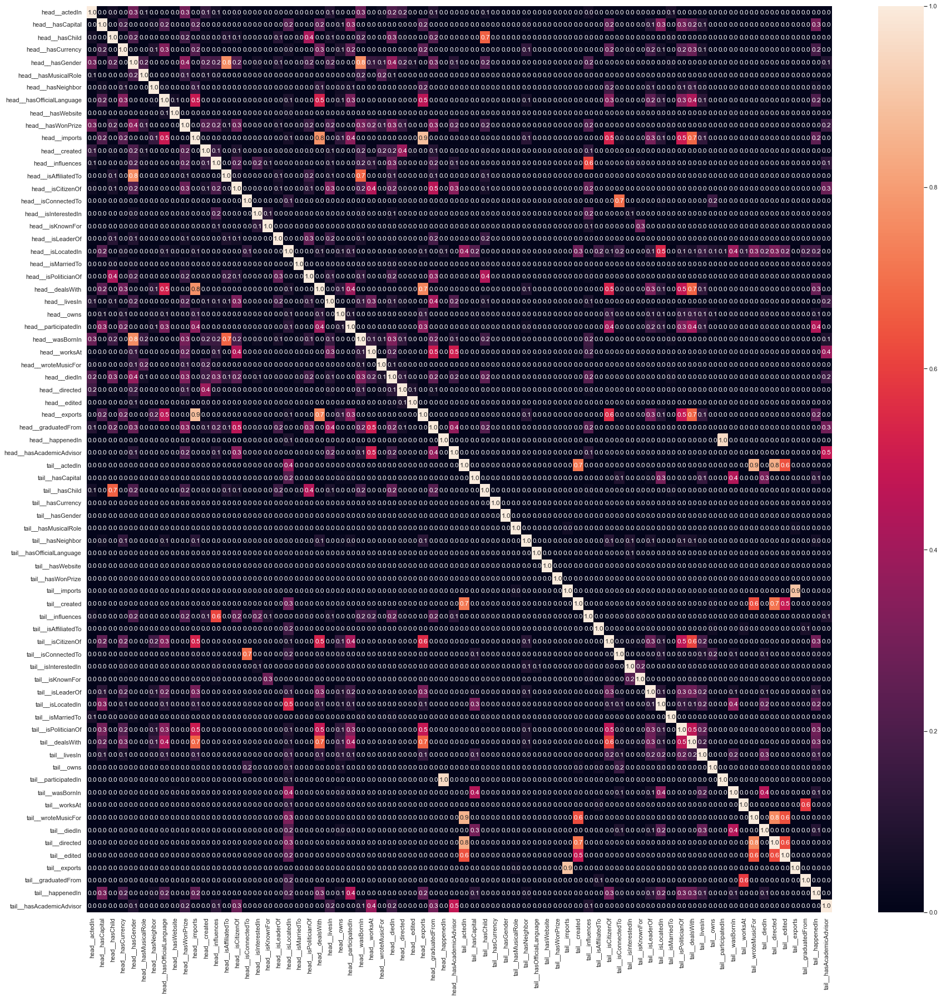

In [54]:
names = []
for relname in df.columns:
    relpos = relname.split("__")[0]
    names.append(relpos + "__" + id2rel[int(relname.split("__")[1].split("_")[0])])

with sns.plotting_context(context='notebook', font_scale=1.2):
    fig, ax = plt.subplots(1, 1, figsize=(30,30))
    sns.heatmap(pd.DataFrame(type_dist, columns = names, index=names), ax=ax, annot=True, fmt='.1f')


0.1410861261164093 0.23751087440768195


/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Threshold: 0.1410861261164093


502.0

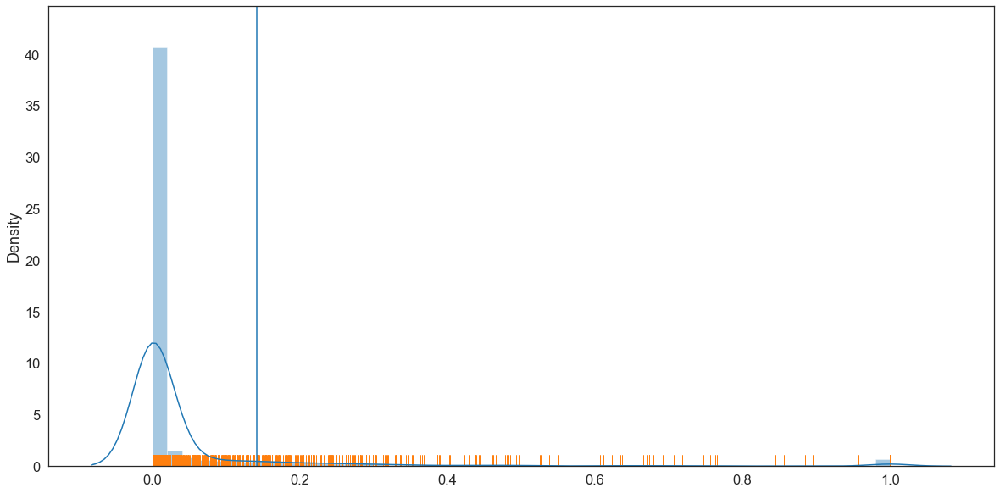

In [56]:
from sklearn.metrics import pairwise_distances
type_dist = 1 - pairwise_distances(df.T.astype(int).values, metric='cosine')
mean_ = np.mean(type_dist[type_dist>0].flatten())
std_ = np.std(type_dist[type_dist>0].flatten())
print(mean_, std_)

with sns.plotting_context(context='notebook', font_scale=1.5):
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    a = type_dist.flatten()
    sns.distplot(a, ax=ax)
    sns.rugplot(a)
    plt.axvline(mean_)




tr = mean_ #np.min(type_dist[type_dist>0].flatten())
print(f'Threshold: {tr}')#- 2*std_
type_dist[type_dist>=tr] = 1
type_dist[type_dist < tr] = 0
#type_dist = np.triu(type_dist)

type_dist.sum()

In [57]:
GG = nx.convert_matrix.from_numpy_matrix(type_dist, create_using=nx.DiGraph())
for comp in nx.algorithms.components.attracting_components(GG):
    print(len(comp))
    if len(comp) < 200:
        #print(comp)
        if 'YAGO' in project:
            rels = []
            for rel in comp:
                relname = df.T.index.tolist()[rel]
                relpos = relname.split("__")[0]
                rels.append(relpos + "__" + id2rel[int(relname.split("__")[1].split("_")[0])])
            print(rels)
        print()

23
['head__actedIn', 'head__hasChild', 'head__hasGender', 'head__hasMusicalRole', 'head__hasWonPrize', 'head__created', 'head__influences', 'head__isAffiliatedTo', 'head__isCitizenOf', 'head__isInterestedIn', 'head__isLeaderOf', 'head__isPoliticianOf', 'head__livesIn', 'head__wasBornIn', 'head__worksAt', 'head__wroteMusicFor', 'head__diedIn', 'head__directed', 'head__graduatedFrom', 'head__hasAcademicAdvisor', 'tail__hasChild', 'tail__influences', 'tail__hasAcademicAdvisor']

31
['head__hasCapital', 'head__hasCurrency', 'head__hasNeighbor', 'head__hasOfficialLanguage', 'head__imports', 'head__isConnectedTo', 'head__isLocatedIn', 'head__dealsWith', 'head__owns', 'head__participatedIn', 'head__exports', 'tail__actedIn', 'tail__hasCapital', 'tail__created', 'tail__isAffiliatedTo', 'tail__isCitizenOf', 'tail__isConnectedTo', 'tail__isLeaderOf', 'tail__isLocatedIn', 'tail__isPoliticianOf', 'tail__dealsWith', 'tail__livesIn', 'tail__owns', 'tail__wasBornIn', 'tail__worksAt', 'tail__wroteMusi

In [58]:
GG = nx.convert_matrix.from_numpy_matrix(type_dist, create_using=nx.DiGraph())
groups = []
for comp in nx.algorithms.components.attracting_components(GG):
    cur_group = set()
    for type_index in comp:
        cur_group.add(df.T.index.tolist()[type_index])
    groups.append(cur_group)
print(f'Will use {len(groups)} synthetic types!')


Will use 16 synthetic types!


In [59]:
series = []
for g in groups:
    series.append(df[g].any(axis=1))
df_synthetic = pd.DataFrame(series).T


In [78]:
##sns.barplot(data=pd.DataFrame(df_synthetic.sum(axis=0) / len(unique_ents)), y=0, x=)
# ss = pd.DataFrame((df_synthetic.sum(axis=0) / len(unique_ents)))
# ss.index =['GROUP_%d' % i for i in range(len(groups))]
# ss = ss.reset_index()
# sns.barplot(data=ss, y=0, x='index')

100 * df_synthetic.sum(axis=0) / len(unique_ents)

0     58.617039
1     40.379541
2      0.052126
3      0.039909
4      0.063528
5      0.290764
6      0.737905
7      0.013031
8      0.001629
9      0.059456
10     0.004072
11     0.009774
12     0.021991
13     0.856003
14     0.025248
15     0.066786
dtype: float64

In [255]:
# Filter very common ones
tr = 1
df_kept = df_synthetic[df_synthetic.columns[((df_synthetic.sum(axis=0) / len(unique_ents)) <= tr)]]
print(f'After filtering will use {len(df_kept.columns)} synthetic types!')

After filtering will use 7 synthetic types!


In [256]:
ent_names = df_kept.index.tolist()
st_types_names = [f'ST__{type_id}' for type_id in df_kept.columns.tolist()]
rows, cols = np.where(df_kept.astype(int).values>0)
to_add_triples = []
for ent_index, type_index in zip(rows, cols):
    to_add_triples.append((ent_names[ent_index], 'HAS_TYPE', st_types_names[type_index]))
print(f'To add: {len(to_add_triples)} new edges!')
print(f'Average number of types per ent: {df_kept[df_kept.sum(axis=1)>0].sum(axis=1).mean():.2f}')

To add: 42685 new edges!
Average number of types per ent: 1.05


In [36]:
try:
    del df_train['head_type']
    del df_train['tail_type']
except KeyError:
    pass

In [249]:
updated_train = df_train.append(pd.DataFrame(to_add_triples, columns=df_test.columns))
# name to save
updated_train.to_csv(path_to_files+"train_st_le_1.txt", index=False, header=False, sep='\t')

In [254]:
keep_only_subset_of_anyburl_rules(f"../AnyBURL/rules/{project}_st_le_1-100")

Initially: 51183 | Currently: 50698  (Dropped 0.95 %) 


In [12]:
c = 0
for comp in nx.algorithms.components.weakly_connected_components(mg):
    print(len(comp))
    #break
    if len(comp) < 200:
        nodes_str = []
        for n in comp:
            if 'head' in n or 'tail' in n:
                position = n.split('__')[0]
                nodes_str.append(position + "__" + id2rel[int(n.split('__')[1].split('_')[0])])
            else:
                nodes_str.append(id2ent[int(n.split('_')[0])])
        print(nodes_str)
    if c == 0:
        big_comp = comp
    c += 1


122699
17
['Russian_ruble', 'United_States_dollar', 'Gold_dinar', 'Greek_drachma', 'tail__hasCurrency', 'French_franc', 'Italian_lira', 'Pakistani_rupee', 'Yugoslav_dinar', 'Australian_dollar', 'West_African_CFA_franc', 'Ancient_Chinese_coinage', 'ISO_4217', 'Soviet_ruble', 'Euro_sign', 'Reichsmark', 'South_African_rand']
3
['female', 'male', 'tail__hasGender']
28
['http://www.rottenburg.de', 'http://www.riskommunal.net/', 'http://www.rottenburg.de/', 'http://www.chennai.tn.nic.in', 'http://www.mds.gov.sk.ca/apps/Pub/MDS/muniDetails.aspx', 'http://www.municipalite', 'http://www.bad-sulza.de', 'http://www.vg-arendsee-', 'http://web.archive.org/web/', 'http://www.grevesmuehlen.de/', 'http://gska2.rada.gov.ua/pls/z7502/A005', 'http://www.ville.', 'http://www.vg-altenkirchen.de', 'http://www.grevesmuehlen.de', 'http://www.bad-sulza.de/', 'http://www.municipalite.', 'http://gov.cap.ru/main.asp', 'http://gska2.rada.gov.ua', 'http://twitter.com/', 'http://www.vg-arendsee-kalbe.de/', 'http://w

In [15]:
# bornIn
id2rel[33], df_train[df_train['rel'] == '33_YAGO']

('wasBornIn',
                head      rel         tail
 7        87293_YAGO  33_YAGO   46297_YAGO
 20       40854_YAGO  33_YAGO  111876_YAGO
 71       31228_YAGO  33_YAGO   80265_YAGO
 126      58256_YAGO  33_YAGO   10469_YAGO
 134     100620_YAGO  33_YAGO   12513_YAGO
 ...             ...      ...          ...
 732422  115812_YAGO  33_YAGO   11542_YAGO
 732442   54235_YAGO  33_YAGO   67131_YAGO
 732495   76139_YAGO  33_YAGO   88995_YAGO
 732516   19945_YAGO  33_YAGO   84387_YAGO
 732552   86611_YAGO  33_YAGO   62791_YAGO
 
 [44978 rows x 3 columns])

In [14]:
id2ent[int('40854')], id2ent[int('111876')]

('Giuseppe_Viani', 'Treviso')

In [17]:
types_df = pd.DataFrame(has_type_edges, columns=['head', 'tail', 'rel'])
subset = df_train[df_train['head'].isin(["40854_YAGO", "111876_YAGO"]) | df_train['tail'].isin(["40854_YAGO", "111876_YAGO"])]
subset= subset.sort_values('head')

for i, row in subset.iterrows():
    nodes_str = []
    for key in row.keys():
        n = row[key]
        if key == 'rel':
            nodes_str.append(id2rel[int(n.split('_')[0])])
        else:
            nodes_str.append(id2ent[int(n.split('_')[0])])
    print(nodes_str)

['Sisley_Volley', 'isLocatedIn', 'Treviso']
['Treviso', 'isLocatedIn', 'Italy']
['Treviso', 'isLocatedIn', 'Veneto']
['Treviso', 'isLocatedIn', 'Province_of_Treviso']
['Treviso_Airport', 'isLocatedIn', 'Treviso']
['Treviso_Basket', 'isLocatedIn', 'Treviso']
['Treviso_F.B.C._1993', 'isLocatedIn', 'Treviso']
['Denis_Marconato', 'wasBornIn', 'Treviso']
['Domenico_Germinale', 'wasBornIn', 'Treviso']
['Alberto_Cavasin', 'wasBornIn', 'Treviso']
["Ercole_III_d'Este,_Duke_of_Modena", 'diedIn', 'Treviso']
['Ezio_Galon', 'wasBornIn', 'Treviso']
['Giuseppe_Viani', 'isAffiliatedTo', 'Benevento_Calcio']
['Giuseppe_Viani', 'isAffiliatedTo', 'Salernitana_Calcio_1919']
['Giuseppe_Viani', 'isAffiliatedTo', 'Inter_Milan']
['Giuseppe_Viani', 'isAffiliatedTo', 'A.C.D._Treviso_2013']
['Giuseppe_Viani', 'isAffiliatedTo', 'S.S._Lazio']
['Giuseppe_Viani', 'wasBornIn', 'Treviso']
['Giuseppe_Viani', 'isAffiliatedTo', 'A.S.D._Siracusa_Calcio']
['Giuseppe_Viani', 'isAffiliatedTo', 'S.C._Siracusa']
['Giuseppe_Vian

In [29]:
nodes = ["40854_YAGO", "111876_YAGO", "102336_YAGO"]
for nn in nodes:
    types = total_dict[nn]
    print(f'Node: {id2ent[int(nn.split("_")[0])]}')
    type_str = []
    for type in types:
        splitted = type.split('__')
        type_str.append(splitted[0] + "__" +id2rel[int(splitted[1].split('_')[0])])
    print(types)
    print(type_str)
    print()

Node: Giuseppe_Viani
{'head__3_YAGO', 'head__13_YAGO', 'head__21_YAGO', 'head__33_YAGO'}
['head__diedIn', 'head__hasGender', 'head__isAffiliatedTo', 'head__wasBornIn']

Node: Treviso
{'tail__33_YAGO', 'tail__27_YAGO', 'tail__3_YAGO', 'head__27_YAGO', 'tail__10_YAGO'}
['tail__wasBornIn', 'tail__isLocatedIn', 'tail__diedIn', 'head__isLocatedIn', 'tail__hasCapital']

Node: Socialist_Party_of_Serbia
{'tail__21_YAGO', 'tail__1_YAGO', 'head__21_YAGO', 'head__27_YAGO'}
['tail__isAffiliatedTo', 'tail__created', 'head__isAffiliatedTo', 'head__isLocatedIn']



In [ ]:
"40854_YAGO" in mg.subgraph(comp)

In [31]:
df_train[df_train['head'] == '102336_YAGO']

,head,rel,tail
303444,102336_YAGO,27_YAGO,11542_YAGO
308275,102336_YAGO,21_YAGO,85337_YAGO
451461,102336_YAGO,21_YAGO,113062_YAGO


In [32]:
id2ent[11542], id2ent[85337], id2ent[113062]

('Belgrade', 'Party_of_United_Pensioners_of_Serbia', 'United_Serbia')

In [ ]:
nx.has_path(mg.to_undirected(), "111876_YAGO", "40854_YAGO")

In [20]:
cur_paths = []
c = 0
max_hops = 10
big_comp_G = mg.subgraph(big_comp).to_undirected()


In [34]:
big_comp_G.edges()

MultiEdgeDataView([('0_YAGO', 'head__27_YAGO'), ('0_YAGO', 'tail__35_YAGO'), ('0_YAGO', 'tail__0_YAGO'), ('0_YAGO', 'tail__1_YAGO'), ('0_YAGO', 'tail__4_YAGO'), ('head__27_YAGO', '10000_YAGO'), ('head__27_YAGO', '10001_YAGO'), ('head__27_YAGO', '10002_YAGO'), ('head__27_YAGO', '10003_YAGO'), ('head__27_YAGO', '10004_YAGO'), ('head__27_YAGO', '10005_YAGO'), ('head__27_YAGO', '10007_YAGO'), ('head__27_YAGO', '10008_YAGO'), ('head__27_YAGO', '100095_YAGO'), ('head__27_YAGO', '10009_YAGO'), ('head__27_YAGO', '1000_YAGO'), ('head__27_YAGO', '10010_YAGO'), ('head__27_YAGO', '10013_YAGO'), ('head__27_YAGO', '10015_YAGO'), ('head__27_YAGO', '10017_YAGO'), ('head__27_YAGO', '10018_YAGO'), ('head__27_YAGO', '100199_YAGO'), ('head__27_YAGO', '10019_YAGO'), ('head__27_YAGO', '1001_YAGO'), ('head__27_YAGO', '10021_YAGO'), ('head__27_YAGO', '10022_YAGO'), ('head__27_YAGO', '10023_YAGO'), ('head__27_YAGO', '10024_YAGO'), ('head__27_YAGO', '100282_YAGO'), ('head__27_YAGO', '10028_YAGO'), ('head__27_YA

In [36]:
max_hops = 5
for path in sorted(nx.algorithms.all_simple_edge_paths(big_comp_G,  "40854_YAGO", "111876_YAGO", cutoff=4)):
    print(path)
    cur_paths.append(" -- ".join([hop[-1] for hop in path]))
    print(cur_paths[-1])
    c +=1
print(f' Paths: {c}')

KeyboardInterrupt: 

In [22]:
nodes_str = []
for n in sorted(nx.algorithms.shortest_path(big_comp_G,  source="111876_YAGO", target="40854_YAGO")):
    print(n)
    if 'head' in n or 'tail' in n:
        position = n.split('__')[0]
        nodes_str.append(position + "__" + id2rel[int(n.split('__')[1].split('_')[0])])
    else:
        nodes_str.append(id2ent[int(n.split('_')[0])])
print(nodes_str)
    #print(n)


102336_YAGO
111876_YAGO
40854_YAGO
head__21_YAGO
head__27_YAGO
['Socialist_Party_of_Serbia', 'Treviso', 'Giuseppe_Viani', 'head__isAffiliatedTo', 'head__isLocatedIn']


In [ ]:
for comp2 in nx.algorithms.components.strongly_connected_components(mg.subgraph(comp)):
    print(len(comp2))
    #break
    if len(comp2) < 200:
        nodes_str = []
        for n in comp2:
            if 'head' in n or 'tail' in n:
                position = n.split('__')[0]
                nodes_str.append(position + "__" + id2rel[int(n.split('__')[1].split('_')[0])])
            else:
                nodes_str.append(id2ent[int(n.split('_')[0])])
        print(nodes_str)



In [ ]:


pos = nx.circular_layout(mg)
edges = mg.edges()

colors = []
edge_labels = {}
for (u,v,r, _) in list(mg.edges.data(keys=True)):
    colors.append('r')
    edge_labels[(u,v)] = r

plt.figure(figsize=(15,10))
nx.draw(mg, pos, edge_color=colors, with_labels = False)
nx.draw_networkx_edge_labels(mg,pos,edge_labels=edge_labels,font_color='red', font_size=18)
plt.axis('off')
plt.show()


In [ ]:
len(mg.nodes())

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:1776: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


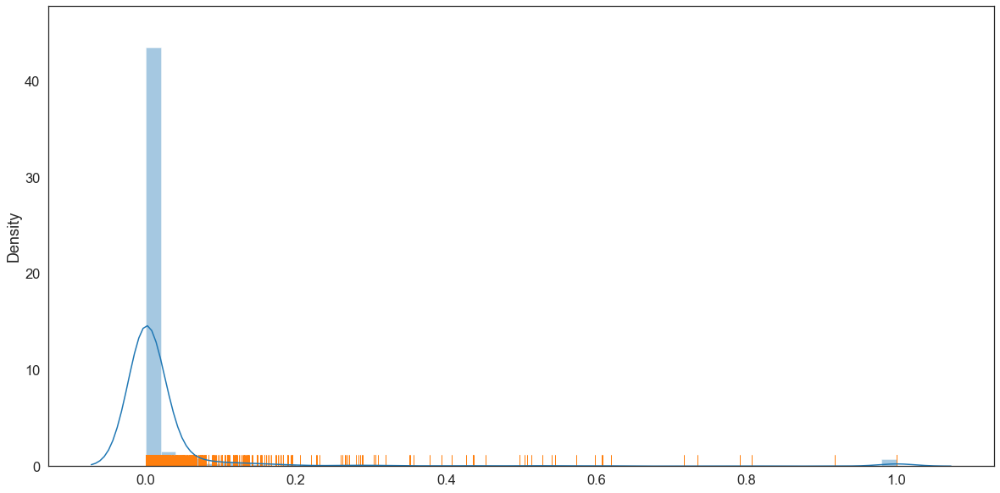

In [40]:
from sklearn.metrics import pairwise_distances
type_dist = 1 - pairwise_distances(df.T.astype(int).values, metric='jaccard')

# for k in pd.Series(type_dist.flatten()).sort_values(ascending=False):
#     print(k)
with sns.plotting_context(context='notebook', font_scale=1.5):
    fig, ax = plt.subplots(1, 1, figsize=(20,10))
    a = type_dist.flatten()
    sns.distplot(a, ax=ax)
    sns.rugplot(a)
    #ax.set_xscale('log')


In [52]:
from sklearn.metrics import pairwise_distances
type_dist = 1 - pairwise_distances(df.T.astype(int).values, metric='cosine')

In [53]:
np.mean(type_dist[type_dist>0].flatten())

0.1410861261164093

In [ ]:
type_dist

In [54]:

tr = 0.14
type_dist[type_dist>=tr] = 1
type_dist[type_dist < tr] = 0
#type_dist = np.triu(type_dist)

type_dist.sum()

502.0

In [ ]:
type_dist.diagonal()

In [ ]:
  np.diagonal(type_dist) = 1

In [ ]:
powers[1], powers[2]

In [ ]:
powers = [type_dist]
not_equal = True
c = 0
while not_equal and c <= 500:
    cur = powers[-1] * powers[0]
    cur = cur.clip(0,1)
    powers.append(cur)

    equal = ~np.array_equal(powers[-1], powers[-2])
    print(f'Diff: {(~(powers[-1] != powers[-2])).sum()}')
    c +=1
    print(c)


In [ ]:
(~(powers[-1] != powers[-2])).sum()



In [142]:

len(rel2id)

36

In [71]:
f'head__{rel2id["hasWebsite"]}'

'head__17'

In [74]:
max_c = 5
c = 0
to_print = []
for ent_id, types in total_dict.items():
    if f'tail__{rel2id["hasNeighbor"]}_YAGO' in types:
        to_print.append(id2ent[int(ent_id.split("_")[0])])
        c += 1
    if  c == max_c:
        print(to_print)
        break

['Vietnam', 'Collectivity_of_Saint_Martin', 'East_Timor', 'Northern_Ireland', 'Russia']


In [ ]:
from copy import deepcopy
rows, cols = np.where(type_dist ==1 )
sim_dict = defaultdict(set)
for r, c in zip(rows, cols):
    sim_dict[r].add(c)

groups = []
for type_, similar_types in sim_dict.items():
    #print(len(sim_dict.keys()))
    #print(type_, similar_types)
    cur = set([item for item in list(similar_types) + [type_]])
    #print(len(sim_dict.keys()))
    is_subgroup = False
    for item in cur:
        fetched = deepcopy(sim_dict[item])
        cur = cur.union(fetched)
    #print(len(sim_dict.keys()))
    for prev_group in groups:
        if prev_group.issuperset(cur):
            is_subgroup = True
            break
    #print(len(sim_dict.keys()))
    if is_subgroup:
        continue
    else:
        groups.append(cur)
   #     print(cur)
    #print(len(sim_dict.keys()))
print(len(groups))

In [ ]:
t
riang = np.triu(type_dist)
p1 = triang.dot(triang.T)
print((p1 == 0).sum())
p2 = p1.dot(triang.T)
print((p2 == 0).sum())

In [ ]:
rows, cols = np.where(type_dist > 0.95)
sim_dict = defaultdict(set)
for r, c in zip(rows, cols):
    sim_dict[r].add(c)
all_s = {}

In [14]:
toy_triples = [
    ("KOSTAS", 'HAS_GENDER', 'MALE'),
    #('KOSTAS', "BORN_IN", "ATHENS"),
    ('ATHENS', 'IS_CAPITAL', 'GREECE'),
    ("EIRINI", 'HAS_GENDER', 'FEMALE'),
    ('EIRINI', "BORN_IN", "BERLIN"),
    ('BERLIN', 'IS_CAPITAL', 'GERMANY'),
    ("GEORGE", 'HAS_GENDER', 'MALE'),
    ('GEORGE', "BORN_IN", "PARIS"),
    ('PARIS', 'IS_CAPITAL', 'FRANCE'),
    ('FRANCE', 'HAS_NEIGHBOR', 'GERMANY'),
    ("GERMANY", "HAS_NEIGHBOR", 'FRANCE')
]
df_toy = pd.DataFrame(toy_triples, columns=['head', 'rel', 'tail'])

G = nx.from_pandas_edgelist(df_toy, source='head', target='tail', edge_attr='rel', create_using=nx.MultiDiGraph())

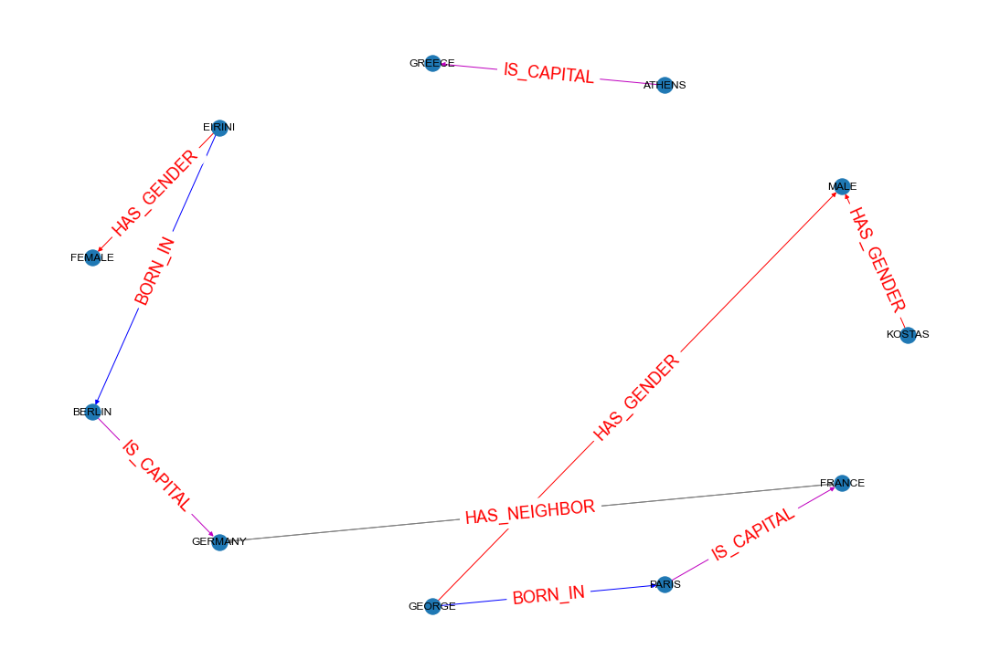

In [16]:
colormap = {
    'HAS_GENDER': 'r',
    'BORN_IN': 'b',
    'IS_CAPITAL': 'm',
    'HAS_NEIGHBOR': 'grey'
}

pos = nx.circular_layout(G)
edges = G.edges()

colors = []
edge_labels = {}
for (u,v,attrib_dict) in list(G.edges.data()):
    colors.append(colormap[attrib_dict['rel']])
    edge_labels[(u,v)] = attrib_dict['rel']

plt.figure(figsize=(15,10))
nx.draw(G, pos, edge_color=colors, with_labels = True)
nx.draw_networkx_edge_labels(G,pos,edge_labels=edge_labels,font_color='red', font_size=18)
plt.axis('off')
plt.show()

In [17]:
unique_rels = sorted(list(df_train['rel'].unique()))
print(f'# of unique rels: {len(unique_rels)}')
df_toy['head_type'] = "head__" + df_toy['rel'].astype(str)
df_toy['tail_type'] = "tail__" + df_toy['rel'].astype(str)

# of unique rels: 36


In [18]:
from collections import defaultdict
head_dict = df_toy.groupby('head')['head_type'].agg(list).to_dict()
tail_dict = df_toy.groupby('tail')['tail_type'].agg(list).to_dict()
total_dict = defaultdict(set)
for ent, values in head_dict.items():
    total_dict[ent] = total_dict[ent].union(values)
for ent, values in tail_dict.items():
    total_dict[ent] = total_dict[ent].union(values)
print(f'# of unique ents: {len(total_dict)}')

# of unique ents: 11


In [19]:
import networkx as nx
mg = nx.MultiDiGraph()
has_type_edges = []
for key, val in tqdm.tqdm_notebook(total_dict.items(), total=len(total_dict)):
    for type_ in val:
        has_type_edges.append((key, type_, str('HAS_TYPE' )))
mg.add_edges_from(has_type_edges);
print(len(mg.edges()))

/Users/Konstantinos.Bougiatiotis@ey.com/anaconda3/envs/lola/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/11 [00:00<?, ?it/s]

19


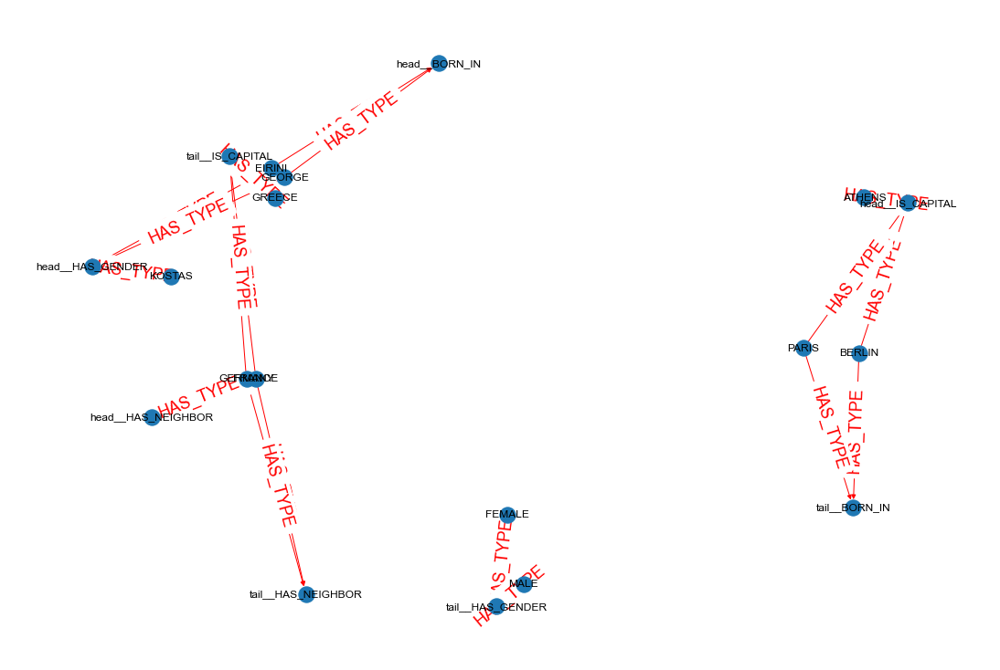

In [21]:
pos = nx.fruchterman_reingold_layout(mg)
edges = mg.edges()

colors = []
edge_labels = {}
for u,v,r,_ in list(mg.edges.data(keys=True)):
    #print(z)
    colors.append('r')
    edge_labels[(u,v)] = r

plt.figure(figsize=(15,10))
nx.draw(mg, pos, edge_color=colors, with_labels = True)
nx.draw_networkx_edge_labels(mg, pos,edge_labels=edge_labels,font_color='red', font_size=18)
plt.axis('off')
plt.show()

In [ ]:
h  as_type_edges

In [ ]:
mg.edges(keys=True)

In [23]:

for comp in nx.algorithms.components.connected_components(mg.to_undirected()):
    print(len(comp))
    if len(comp) < 200:
        print(sorted(list(comp)))

5
['ATHENS', 'BERLIN', 'PARIS', 'head__IS_CAPITAL', 'tail__BORN_IN']
5
['EIRINI', 'GEORGE', 'KOSTAS', 'head__BORN_IN', 'head__HAS_GENDER']
6
['FRANCE', 'GERMANY', 'GREECE', 'head__HAS_NEIGHBOR', 'tail__HAS_NEIGHBOR', 'tail__IS_CAPITAL']
3
['FEMALE', 'MALE', 'tail__HAS_GENDER']


# USE PRIME NUMBERS FOR CLUSTERING!!

In [11]:
rel2id

{'actedIn': 0,
 'created': 1,
 'dealsWith': 2,
 'diedIn': 3,
 'directed': 4,
 'edited': 5,
 'exports': 6,
 'graduatedFrom': 7,
 'happenedIn': 8,
 'hasAcademicAdvisor': 9,
 'hasCapital': 10,
 'hasChild': 11,
 'hasCurrency': 12,
 'hasGender': 13,
 'hasMusicalRole': 14,
 'hasNeighbor': 15,
 'hasOfficialLanguage': 16,
 'hasWebsite': 17,
 'hasWonPrize': 18,
 'imports': 19,
 'influences': 20,
 'isAffiliatedTo': 21,
 'isCitizenOf': 22,
 'isConnectedTo': 23,
 'isInterestedIn': 24,
 'isKnownFor': 25,
 'isLeaderOf': 26,
 'isLocatedIn': 27,
 'isMarriedTo': 28,
 'isPoliticianOf': 29,
 'livesIn': 30,
 'owns': 31,
 'participatedIn': 32,
 'wasBornIn': 33,
 'worksAt': 34,
 'wroteMusicFor': 35}

In [86]:
# rel2id = {}
# id2rel = {}
# for i, rel in enumerate(unique_rels):
#     rel2id[rel] = i
#     id2rel[i] = rel

node2id = {}
id2node = {}
for i, node in enumerate(unique_ents):
    node2id[node] = i
    id2node[i] = node

from sympy import nextprime, primefactors
relid2prime = {}
prime2relid = {}
current_int = 2
for rel in rel2id.keys():
    cur_prime = nextprime(current_int)
    relid2prime[rel] = cur_prime
    prime2relid[cur_prime] = rel
    current_int = cur_prime
print(relid2prime)


{'P101': 3, 'P102': 5, 'P1050': 7, 'P106': 11, 'P108': 13, 'P112': 17, 'P119': 19, 'P1303': 23, 'P135': 29, 'P136': 31, 'P138': 37, 'P140': 41, 'P1412': 43, 'P159': 47, 'P161': 53, 'P17': 59, 'P172': 61, 'P19': 67, 'P20': 71, 'P2348': 73, 'P26': 79, 'P264': 83, 'P27': 89, 'P30': 97, 'P3095': 101, 'P3373': 103, 'P35': 107, 'P361': 109, 'P37': 113, 'P40': 127, 'P451': 131, 'P463': 137, 'P495': 139, 'P509': 149, 'P530': 151, 'P551': 157, 'P69': 163, 'P737': 167, 'P740': 173, 'P749': 179, 'P800': 181, 'P840': 191}


In [84]:
df_train['rel']

0        P1412
1         P509
2         P463
3        P1412
4         P463
         ...  
32883     P106
32884     P106
32885     P136
32886     P106
32887     P509
Name: rel, Length: 32888, dtype: object

In [91]:

from scipy.sparse import csc_matrix


df_train['head_id'] = df_train['head'].map(node2id)
df_train['tail_id'] = df_train['tail'].map(node2id)
df_train['prime_id'] = df_train['rel'].map(relid2prime)
row, val, col = zip(*list(df_train[['head_id', 'prime_id', 'tail_id']].drop_duplicates(subset=['head_id', 'tail_id']).itertuples(index=False, name=None)))

A_big = csc_matrix((val, (row, col)), shape=(len(unique_ents), len(unique_ents)), dtype=np.int64)
A_num_rels = csc_matrix((val, (row, col)), shape=(len(unique_ents), len(unique_ents)), dtype=np.int64)

del df_train['head_id']
del df_train['tail_id']
del df_train['prime_id']

In [72]:
#A_big = np.zeros((len(unique_nodes), len(unique_nodes)), dtype=np.int16)
#A_ind = A_big.copy()
# from collections import defaultdict
# from scipy.sparse import csc_matrix
from sympy import nextprime, primefactors

# val_rels_dict = defaultdict(int)
# num_rels_dict = defaultdict(int)
# c = 0
# missed_nodes = []
# skipped_edge_indexes = []
# for i, row in df_train.iterrows():
#     if val_rels_dict[(node2id[row['head']], node2id[row['tail']])] > 0:
#         c += 1
#         missed_nodes.extend([node2id[row['head']], node2id[row['tail']]])
#         skipped_edge_indexes.append(i)
#         continue
#     val_rels_dict[(node2id[row['head']], node2id[row['tail']])] += relid2prime[rel2id[row['rel']]]
#     num_rels_dict[(node2id[row['head']], node2id[row['tail']])] += 1
# print(f'Skipped {c} edges coming from head to the same tail more than one..')
# print(f'Avoid using nodes: {sorted(set(missed_nodes))}')
# row = []
# col = []
# val_rels = []
# num_rels = []
# for key, val in val_rels_dict.items():
#     row.append(key[0])
#     col.append(key[1])
#     # if val == 1:
#     #     cur_val = 0
#     # else:
#     #     cur_val = val
#     val_rels.append(val)
#     num_rels.append(num_rels_dict[key])
# row = np.array(row)
# col = np.array(col)
# val_rels = np.array(val_rels)
# num_rels = np.array(num_rels)
# print('Will create the sparse matrices')

KeyboardInterrupt: 

In [ ]:
A_big = csc_matrix((val_rels, (row, col)), shape=(len(unique_ents), len(unique_ents)), dtype=np.int64)
A_num_rels = csc_matrix((num_rels, (row, col)), shape=(len(unique_ents), len(unique_ents)), dtype=np.int64)

In [ ]:
del row
del col
del num_rels_dict
del val_rels_dict

In [92]:
max_order = 2

power_A = [A_big]#[A, np.matmul(A, A), np.matmul(np.matmul(A, A), A)]
power_A_clipped = [A_num_rels]

for _ in range(1, max_order):
    power_A.append(power_A[-1] * A_big)
    power_A_clipped.append(power_A_clipped[-1] * A_num_rels)
len(power_A)

2

In [93]:
def get_log_sum_per_axis(A_big, axis=1):
    """
    Get the log_sum instead of prob for overflow protection
    :param A_big:
    :param axis:
    :return:
    """
    nnz_indexes = A_big.getnnz(axis=axis)
    index2_nnz = defaultdict(list)
    for i, index in enumerate(nnz_indexes):
        index2_nnz[index].append(i)
    prod_ = []
    for i in range(A_big.shape[1-axis]):
        cur = np.sum(np.log(A_big.data[index2_nnz[i]]))
        prod_.append(cur)
    return np.array(prod_), index2_nnz

col_sum, _ = get_log_sum_per_axis(A_big, axis=0)
row_sum, _ = get_log_sum_per_axis(A_big, axis=1)

In [98]:
proba_ = row_sum + col_sum
proba_[proba_>0] = 1
proba_[proba_<=0] = 0
proba_ = proba_ / proba_.sum()
proba_

array([0.0060241, 0.0060241, 0.0060241, ..., 0.       , 0.       ,
       0.       ])

In [26]:
row_sum = np.asarray(A_big.sum(axis=1)).flatten()
col_sum = np.asarray( A_big.sum(axis=0)).flatten()

In [99]:
import plotly.express as px
import scipy

sample_N = 100
names = np.array([ent for ent in list(id2node.values())]) #np.array([id2ent[int(ent.split("_")[0])] for ent in list(id2node.values())])
indices = np.random.choice(np.arange(len(names)), size=sample_N, replace=False, p=proba_)
fig = px.scatter(x=row_sum[indices], y=col_sum[indices], hover_name=names[indices])
fig.show()

In [32]:
names[indices]

array(['Sault_Ste._Marie,_Michigan', 'Doris_Angleton',
       'Abubakar_Bello-Osagie', 'Jim_Stannard',
       'Tommy_Dunne_(footballer_born_1972)', 'Emilio_Caprile',
       'Western_Strikers_SC', 'nl/Francisco_López_Fernández',
       'Kleist_Prize', 'Suzanne_Pleshette'], dtype='<U95')

In [34]:
row_sum[indices]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [49]:
print(indices)
wanted_ind = 44510
col_sum[wanted_ind], row_sum[wanted_ind], proba_[wanted_ind]

[ 44510  21078 102853  57457  12015  34930  95043   3747  25114  36728]


(0.0, 0.0, 0.0)

In [37]:
index2_nnz[121483]


[]

In [46]:

scipy.special.softmax(proba_)

array([2.20018150e-05, 2.20018150e-05, 2.20018150e-05, ...,
       8.09401542e-06, 8.09401542e-06, 8.09401542e-06])

In [63]:
stacked = np.vstack((row_sum, col_sum)).T
pd.DataFrame(stacked).to_csv("../data/yago_prod_col_sum.tsv", sep='\t', index=False,header=False)
pd.DataFrame(names).to_csv("../data/yago_names.tsv", sep='\t', index=False,header=False)

In [62]:
pd.DataFrame(names).shape


(122780, 1)